In [3]:
#packages

using Pkg
#Pkg.add("LinearAlgebra")
#Pkg.add("LinearSolve")
#Pkg.add("Plots")
#Pkg.add("Printf")
#Pkg.add("LaTeXStrings")
#Pkg.add("Interpolations")
#Pkg.add("NPZ")


using LinearAlgebra
using LinearSolve
using Plots
using LaTeXStrings
using Interpolations
using NPZ
using Printf


#-------------------------------------------------------------------------------------
#	dressing of function f (given as array f_discr, occupation ratio given as n_discr)
#-------------------------------------------------------------------------------------


function f_varphimat(lam_discr,gb)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)
    return varphimat
end 

function f_dlam(lam_discr)
    L = size(lam_discr)[1]
    dlam = zeros(L)
    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])
    return dlam
end
    
function dress(gb, lam_discr, n_discr, f_discr)
    
    
    varphimat = f_varphimat(lam_discr,gb)
    dlam = f_dlam(lam_discr)
    
    A = I - 0.5/pi * varphimat*Diagonal(n_discr)*Diagonal(dlam)
    A\f_discr
end

#-------------------------------------------------------------------------------------
#	to evaluate charge density associated with function f
#-------------------------------------------------------------------------------------

function charge_density(gb, lam_discr, n_discr, f_discr)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])
    A = I - 0.5/pi * varphimat*Diagonal(n_discr)*Diagonal(dlam)
    0.5/pi * dot(dlam , Diagonal(n_discr) * (A \ f_discr) )
end

#-------------------------------------------------------------------------
#	solve Yang-Yang equation
#-------------------------------------------------------------------------

function fun1(z)
    if z>0
        return log(1. +exp(-z))
    else
        return log(1. +exp(z)) - z
    end
end

function fun2(z)
    if z<0
        return 1. /(1. +exp(z))
    else
        return exp(-z)/(1. +exp(-z))
    end
end

function yangyang(gb, beta, lam_discr)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])

    bare_E = 0.5 * beta[3] * lam_discr.^2 + beta[2] * lam_discr + beta[1] * ones(L)
    eps = copy(bare_E)
    n = fun2.(eps)

    #iterative solution
    diff = 1.
    while diff>1e-12
        old_n = copy(n)
        eps = bare_E - 0.5/pi * varphimat*Diagonal( fun1.(eps) )*dlam
        n = fun2.(eps)
        diff = norm(n-old_n)
    end
    return n
end

#-------------------------------------------------------------------------------------
#	compute effective velocity
#-------------------------------------------------------------------------------------

function veff(gb, lam_discr, n_discr)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])
    dresser = I - 0.5/pi * varphimat*Diagonal(n_discr)*Diagonal(dlam)
    onedr = dresser\ones(L)
    iddr = dresser\copy(lam_discr)
    iddr ./ onedr
end

#-------------------------------------------------------------------------------------
#	time evolution for box expansion
#-------------------------------------------------------------------------------------

function evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
    npts_integral = 600
    L = size(x1)[1]
    
    veff1 = zeros(L)
    veff2 = zeros(L)
    #println(@sprintf "size x2 = %.3f , size theta_tab  = %.3f " size(x1)[1] size(theta_tab)[1])
    #display(x2)
    #display(theta_tab)
    f2 = linear_interpolation(x2, theta_tab)
    f1 = linear_interpolation(x1, theta_tab)
    #velocity of first and last points is the one of free particles
    veff1[1] = theta_tab[1]
    veff2[L] = theta_tab[L]

    for j in 2:L
        thet1 = theta_tab[j]
        if x1[j]<x2[1]
            thet2 = theta_tab[1]
        else
            thet2 = f2(x1[j])
        end
        lam_discr = LinRange(thet2,thet1,npts_integral)
        n_discr = n_fun.(lam_discr)
        veff1[j] = last(veff(gb, lam_discr, n_discr))
        #velocities of right contour (using parity symmetry)
        #veff2[L+1-j] = -veff1[j]
    end
    # sans symetrie
    for j in 1:L-1
        thet1 = theta_tab[j]
        if x2[j] > x1[L]
            thet2 = theta_tab[L]
        else 
            thet2 = f1(x2[j])
        end 
        lam_discr = LinRange(thet1, thet2, 600)
        n_discr = n_fun.(lam_discr)
        veff2[j] = veff(gb, lam_discr, n_discr)[1]
    end
    
    return x1 + dt*veff1, x2 + dt*veff2
end

#-------------------------------------------------------------------------------------
#	box expansion: calculate density (careful: return density in units of rapidities
#    for density in mu^-1 multiply by mass/hbar)
#-------------------------------------------------------------------------------------

function eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
    L = size(x1)[1]
    
    dens = zeros(2,2*L)
    f2 = linear_interpolation(x2, theta_tab)
    f1 = linear_interpolation(x1, theta_tab)
    #density of first and last points is zero
    dens[1,1] = x1[1]
    dens[2,1] = 0
    dens[1,L+1] = x2[L]
    dens[2,L+1] = 0
    #println( @sprintf "n_p = %.3f" ratio_m_hbar * charge_density(gb, theta_tab, n_fun.(theta_tab), ones(size(theta_tab)[1]) ))
    for j in 2:L
        thet1 = theta_tab[j]
        if x1[j]<x2[1]
            thet2 = theta_tab[1]
        else
            #println("nnn")
            thet2 = f2(x1[j])
        end
        lam_discr = LinRange(thet2,thet1,600)
        n_discr = n_fun.(lam_discr)
        dens[1,j] = x1[j]
        dens[2,j] = ratio_m_hbar * charge_density(gb, lam_discr, n_discr, ones(size(lam_discr)[1]) )
        #if j == L 
        #    println( @sprintf " j = %.3f , theta 1 = %.3f , theta 2 = %.3f , n_p1 = %.3f" j thet2 thet1 dens[2,j])
        #end 
        #velocities of right contour (using parity symmetry)
        #dens[1,L+j] = x2[L+1-j]      
        #dens[2,L+j] = dens[2,j]
    end
    #without symmetry 
    for j in 1:L-1
        thet1 = theta_tab[j]
        if x2[j]>x1[L]
            thet2 = theta_tab[L]
        else 
            #println("nnn")
            thet2 = f1(x2[j])
        end 
        lam_discr = LinRange(thet1,thet2,600)
        n_discr = n_fun.(lam_discr)
        dens[1,2*L+1-j] = x2[j] 
        dens[2,2*L+1-j] = ratio_m_hbar * charge_density(gb, lam_discr, n_discr, ones(size(lam_discr)[1]) ) 
        #if j == 1 
        #    println( @sprintf " j = %.3f , theta 1 = %.3f , theta 2 = %.3f , n_p1 = %.3f" j thet1 thet2 dens[2,2*L+1-j])
        #end 
    end
    #sort densities according to positions, and return
    dens[:,sortperm(dens[1, :])]
end

#------------------------------------------------------------------------------------------------
#	function for simulating box expansion. Writes results in file 'data/density_expansion_t.npd'
#     where 't' is the time (takes a list of times to be saved as argument)
#------------------------------------------------------------------------------------------------

function box_expansion(n_fun, dt, list_t_save, theta_max, npts, gb, ratio_m_hbar)
    tmax = maximum(list_t_save)
    theta_tab = LinRange(-theta_max, theta_max, npts)
    x1 = -0.5 * ones(npts) + 0.0000001*theta_tab
    x2 = 0.5 * ones(npts) + 0.0000001*theta_tab
        
    t = 0
    while t<=tmax
        x1, x2 = evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
        t += dt
        
        for ts in list_t_save
            if t-dt<ts && ts<=t
                mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
                println(@sprintf "t = %.3f saved" t)
                #filename = @sprintf "%s/density_expansion_n_theta_etoile_conv_py_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mu) Float64(T) Float64(Taille) Float64(t)
                #filename = @sprintf "%s/density_expansion_n_py_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mu) Float64(T) Float64(Taille) Float64(t)
                filename = @sprintf "%s/density_expansion_n_theta_etoile_py_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mup/kB) Float64(T) Float64(Taille) Float64(t)
                #filename = @sprintf "%s/density_expansion_n_tout_py_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mup/kB) Float64(T) Float64(Taille) Float64(t)
                npzwrite(filename, mydensity)
            end
        end
    end
end



box_expansion (generic function with 1 method)

In [4]:
function DeltaMat(theta_discr , gbar )
    L = size(theta_discr)[1]
    varphi(theta) = 2*gbar/( gbar^2 + theta^2 )
    varphimat = zeros(L,L)
    

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( theta_discr[i]-theta_discr[j] )
            varphimat[j,i] = varphi( theta_discr[i]-theta_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)
    return varphimat
end 

function Delta(theta_discr)
    L = size(theta_discr)[1]
    dtheta = zeros(L)
        
    for i = 2:L-1
        dtheta[i] = 0.5*(theta_discr[i+1]-theta_discr[i-1])
    end
    dtheta[1] = 0.5*(theta_discr[2]-theta_discr[1])
    dtheta[L] = 0.5*(theta_discr[L]-theta_discr[L-1])
    
    return dtheta
end 

function montrer_les_rho(theta_discr, nu_discr)
    L = length(theta_discr)
    
    varphimat = DeltaMat(theta_discr , gbar)
    dtheta = Delta(theta_discr)
    
    # Plot nu_tilde
    p = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="f", legend=:topright)
    plot!(p , theta_discr , nu_discr, label="\$\\tilde{\\nu}\$")
    # Méthode 0
    rho_s_0 = 0.5 / pi * dress(gbar , theta_discr, nu_discr, ones(L))
    rho_0 = nu_discr .* rho_s_0
    
    # Méthode 1
    Mat_F_1 = I - (1 / (2 * pi)) * Diagonal(dtheta) * Diagonal(nu_discr) * varphimat
    B = (1 / (2 * pi)) * nu_discr
    rho_1 = Mat_F_1 \ B
    rho_s_1 = rho_1 ./ nu_discr

    # Méthode 2
    Mat_F_2 = I - 0.5 / pi * varphimat * Diagonal(nu_discr) * Diagonal(dtheta)
    B = (1 / (2 * pi)) * ones(L)
    rho_s_2 = Mat_F_2 \ B
    rho_2 = nu_discr .* rho_s_2
    
    # Plot résultats de la méthode 0
    plot!(p, theta_discr, rho_s_0, label="Meth 0 : \$\\tilde{\\rho_s}= \\frac{1}{2\\pi}\\\$")
    plot!(p, theta_discr, rho_0, label="Meth 0 : \$\\tilde{\\rho} = \\tilde{\\nu} * \\tilde{\\rho_s}\$")
    
    # Plot résultats de la méthode 1
    plot!(p, theta_discr, rho_1, label="Meth 1 : \$\\tilde{\\rho}= \\frac{\\tilde{\\nu}}{2\\pi} ( 1 + \\tilde{\\Delta} * \\tilde{\\rho}) \$")
    plot!(p, theta_discr, rho_s_1, label="Meth 1 : \$\\tilde{\\rho}_s  = \\frac{\\tilde{\\rho}}{\\tilde{\\nu}}  \$")
    
    # Plot résultats de la méthode 2
    plot!(p, theta_discr, rho_s_2, label="Meth 2 : \$\\tilde{\\rho_s}= \\frac{1}{2\\pi}\$")
    plot!(p, theta_discr, rho_2, label="Meth 2 : \$\\tilde{\\rho} = \\tilde{\\nu} * \\tilde{\\rho_s}\$")

    display(p)
    
    #p1 = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="\$\\Delta\$", legend=:topright)

    # Plot des différences entre les résultats des deux méthodes
    #plot(p1,theta_discr, rho_s_1 - rho_s_2, label="\$ \\Delta \\tilde{\\rho_s}\$")
    #plot(p1,theta_discr, rho_1 - rho_2, label="\$\\Delta \\tilde{\\rho}\$")

    # Légendes et labels
    #display(p1)
end

#-------------------------------------------------------------------------------------
#	theta start
#-------------------------------------------------------------------------------------

using Roots
function find_nu_theta_star_discr( theta_discr , theta_star  , nu_discr )
    return ifelse.(theta_discr .> theta_star, 0, nu_discr)
end 

function find_theta_star(theta_discr, nu_discr ,  gbar)
    
    # Définition de la fonction f_veff_star_theta_star
    f_veff_star_theta_star = theta_star -> linear_interpolation(theta_discr, veff( gbar, theta_discr, find_nu_theta_star_discr(theta_discr, theta_star, nu_discr)))(theta_star)
    
    return fzero(f_veff_star_theta_star, theta_discr[1] , last(theta_discr))
end

find_theta_star (generic function with 1 method)

In [5]:
import Pkg
#Pkg.add("Dates")
using Dates

# Formater la date selon le format spécifié
new_date = Dates.format(Dates.today(), "yyyy-mm-dd")

# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)

2024-04-11


In [6]:
new_date = "analyse1_2024-03-06"
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)

analyse1_2024-03-06


In [7]:
using Plots
using Printf
using Interpolations

# Définir les constantes
hbar = 1.05457182e-25   # um^2.kg/ms
mass =  1.44e-25        # kg (mass of Rubidium 87)
kB = 1.380649e-26       # um^2.ms^-2.kg.nK^{-1}
a3D = 5.3e-3            # um
om_perp = 2 * pi * 2.56  # kHz (transverse frequency)

# Calculer les constantes dérivées
g = 2 * hbar * a3D * om_perp        # effective 1d repulsion strength
c = mass / hbar^2 * g              # um^{-1}
gbar = g / hbar                   # um.ms^{-1}

0.17050051649562528

  0.047966 seconds (2.47 k allocations: 11.687 MiB, 45.73% gc time)


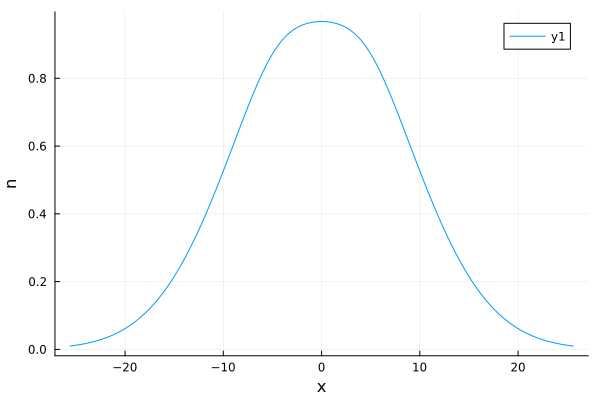

  0.011837 seconds (20 allocations: 11.464 MiB)
  0.000026 seconds (3 allocations: 4.125 KiB)
saved : test/theta_discr.npz
saved : test/nu_discr.npz
saved : test/rho_discr.npz


In [56]:
theta_max = 20
npts = 200
theta_discr = LinRange(-theta_max, theta_max , npts) 

#------------------------------------------------------------------------------------------------
#	Fonction pour calculer les nu , rho et rho_s et predire cest fonction apres la coupure 1 
#-
function save_nu_rho_rho_s(new_date , nom , theta_discr, n_p  , mup , T , Taille , gbar )
    if mup == "None" 
       mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
    else 
        n_p = (((mup / (hbar * om_perp)) + 1)^2 - 1) / (4 * a3D)
    end
    # Discrétisation de theta
    beta = [-mup / (kB * T) 0 mass * g^2/(kB * T * hbar^2)]
    beta = [-mup / (kB * T) 0 mass /(kB * T)]

    # Définir la date sous forme de chaîne

    index_last_underscore = findlast(isequal('_'), nom)

    
    filename = @sprintf "%s/theta_discr_%s.npz" new_date nom[index_last_underscore+1:end]
    npzwrite(filename, theta_discr )
    println("saved : ", filename)  

    @time nu_discr = yangyang(gbar, beta, theta_discr)
    println("size : ", size(nu_discr)[1])
    filename = @sprintf "%s/nu_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, nu_discr )
    println("saved : ", filename)
    montrer_les_rho(theta_discr , nu_discr)

    @time rho_s_discr = 0.5 / pi * mass/hbar*dress(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]))
    filename = @sprintf "%s/rho_s_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_s_discr )
    println("saved : ", filename)

    @time rho_discr = nu_discr .* rho_s_discr
    filename = @sprintf "%s/rho_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_discr )
    println("saved : ", filename)

    @time theta_star = find_theta_star(theta_discr, nu_discr ,gbar)
    filename = @sprintf "%s/%s_%.3f_%.3f.npz" new_date nom mup/kB T
    npzwrite(filename, theta_star )
    println("saved : ", filename)

    @time nu_theta_star_discr = find_nu_theta_star_discr(theta_discr , theta_star  , nu_discr )
    filename = @sprintf "%s/nu_%s_discr_%s_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T
    nu_theta_star_discr = Float64.(nu_theta_star_discr)
    npzwrite(filename, nu_theta_star_discr )
    println("saved : ", filename)
    
    f_veff_star_theta_star = theta_star -> linear_interpolation(theta_discr, veff( gbar, theta_discr, ifelse.(theta_discr .> theta_star, 0, nu_discr)))(theta_star)
    println( @sprintf "veff (%.3f) = %.3f" theta_star f_veff_star_theta_star(theta_star))

    
    function f_veff_star_theta_star_2(theta_star, theta_discr, veff, gbar, nu_discr)
        #nu_theta_star_discr = find_nu_theta_star_discr(theta_discr, theta_star, nu_discr)
        nu_theta_star_discr_ast = ifelse.(theta_discr .> theta_star, 0, nu_discr)
        v_eff = veff(gbar, theta_discr, nu_theta_star_discr_ast)
        interpolation = LinearInterpolation(theta_discr, v_eff)
        return interpolation(theta_star)
    end

    # Calculer f_veff_star_theta_star pour chaque élément de theta_star
    #f_veff_star_theta_star_vector = [f_veff_star_theta_star_2(theta_star, theta_discr, veff, gbar, nu_discr) for theta_star in theta_star]
    #display(f_veff_star_theta_star_vector)
    f_veff_star_theta_star_vector_1 = zeros(npts)
    f_veff_star_theta_star_vector_2 = zeros(npts)
    for i = 1:npts
        f_veff_star_theta_star_vector_1[i] = f_veff_star_theta_star(theta_discr[i])
        f_veff_star_theta_star_vector_2[i] = f_veff_star_theta_star_2(theta_discr[i], theta_discr, veff, gbar, nu_discr)
    end
    # Affichage des résultats
    for (theta_star_value, f_value) in zip(theta_discr, f_veff_star_theta_star_vector_2)
        if abs.(f_value)<1 
            println(@sprintf "veff (%.3f) = %.3f" theta_star_value f_value)
        end
    end
    
    
    theta_star = fzero(f_veff_star_theta_star, theta_star-1 , theta_star+1)
    println(@sprintf "theta_star = %.3f " theta_star)



    @time rho_s_theta_star_discr = 0.5 / pi * mass/hbar * dress(gbar, theta_discr, nu_theta_star_discr, ones(size(theta_discr)[1]))
    filename = @sprintf "%s/rho_s_%s_discr_%s_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_s_theta_star_discr )
    println("saved : ", filename)

    @time rho_theta_star_discr = nu_theta_star_discr .* rho_s_theta_star_discr
    filename = @sprintf "%s/rho_%s_discr_%s_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_theta_star_discr )
    println("saved : ", filename)
    
    return theta_discr , nu_discr , rho_s_discr , rho_discr , theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr

end 



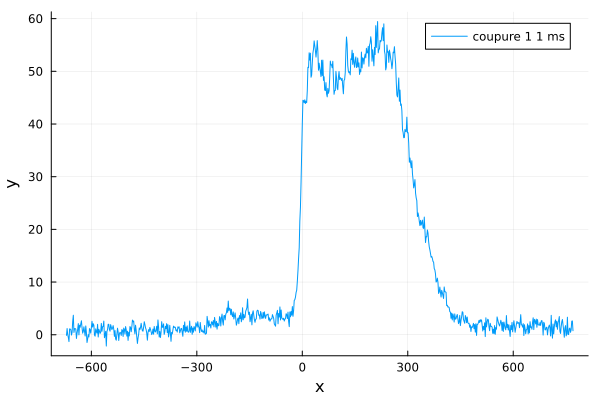

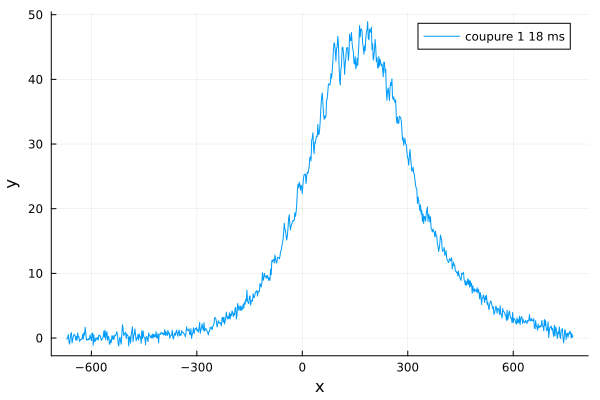

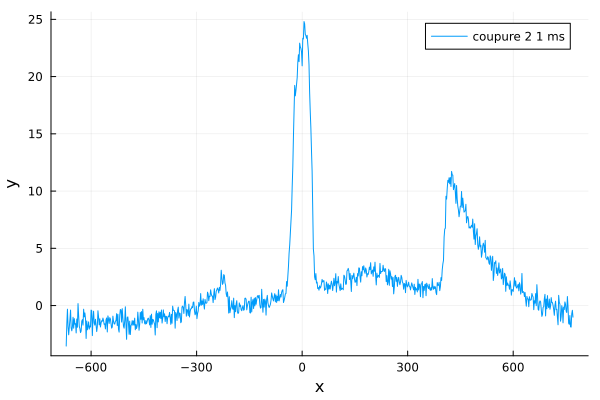

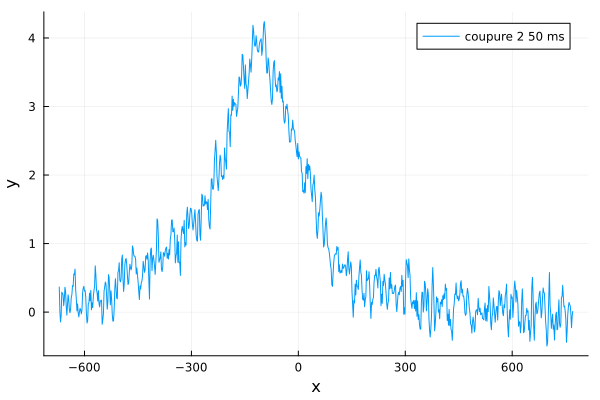

In [26]:
using DelimitedFiles

date_donnees = "2024-02-29"

DONNEES = []

if date_donnees == "None"
    fichier_x = "Scan43_coupure2_1ms_x.txt"
    fichier_y = "Scan43_coupure2_1ms_n.txt"
    Donnees = [readdlm("2024-02-05/Donnees/$(fichier_x)") , reverse(readdlm("2024-02-05/Donnees/$(fichier_y)")) * 0 , "2em coupure 1ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_coupure1_10ms_x.txt"
    fichier_y = "Scan43_coupure1_10ms_n.txt"
    Donnees = [readdlm("2024-02-05/Donnees/$(fichier_x)") , reverse(readdlm("2024-02-05/Donnees/$(fichier_y)")) * 0 , "1er coupure 10 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_x.txt"
    fichier_y = "Scan43_n.txt"
    Donnees = [readdlm("2024-02-05/Donnees/$(fichier_x)") , reverse(readdlm("2024-02-05/Donnees/$(fichier_y)")) * 0 , "2em coupure 40 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-02-05"
    fichier_x = "Scan43_coupure2_1ms_x.txt"
    fichier_y = "Scan43_coupure2_1ms_n.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , reverse(readdlm("$(date_donnees)/Donnees/$(fichier_y)")) , "2em coupure 1ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_coupure1_10ms_x.txt"
    fichier_y = "Scan43_coupure1_10ms_n.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , reverse(readdlm("$(date_donnees)/Donnees/$(fichier_y)")) , "1er coupure 10 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_x.txt"
    fichier_y = "Scan43_n.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , reverse(readdlm("$(date_donnees)/Donnees/$(fichier_y)")) , "2em coupure 40 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-02-09"
    fichier_x = "X_Scan704_18ms.txt"
    fichier_y = "Y_Scan704_18ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "Première coupure expansion 18 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_Scan696_1ms.txt"
    fichier_y = "Y_Scan696_1ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "Seconde coupure sélection 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_Scan696_50ms.txt"
    fichier_y = "Y_Scan696_50ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "Seconde coupure expansion 50 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-02-29" 
    fichier_x = "X_coupure1_1ms.txt"
    fichier_y = "Y_coupure1_1ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 1 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure1_28ms.txt"
    fichier_y = "Y_coupure1_28ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 1 18 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure2_1ms.txt"
    fichier_y = "Y_coupure2_1ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 2 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure2_50ms.txt"
    fichier_y = "Y_coupure2_50ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 2 50 ms"]
    push!(DONNEES, Donnees)
end

for i in 1:length(DONNEES)
    p = plot(xlabel="x", ylabel="y", legend=:topright)                           
    x , y , label = DONNEES[i]    
    plot!(p, x,  y, label = label)
    display(p)                         
end                             

# Bord ( 2em coupure homogène)

In [10]:
function pre_model_fit_homo(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )
    
    function box_expansion(n_fun, dt, list_t_save, theta_max, npts, gb, ratio_m_hbar)
        
        filename0 = @sprintf "%s/density_expansion_nu_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
    
        tmax = maximum(list_t_save)
        theta_tab = LinRange(-theta_max, theta_max, npts)
        x1 = -0.5 * ones(npts) + 0.0000001*theta_tab
        x2 = 0.5 * ones(npts) + 0.0000001*theta_tab

        t = 0

        mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
        println(@sprintf "t = %.3f saved" t*Taille)
        filename = filename0 * @sprintf("%.3f.npz", Float64(t))
        println("saved : ", filename)
        npzwrite(filename, mydensity)

        #p = plot(xlabel="x", ylabel="n", legend=:topright)
        #plot!(p, mydensity[1,:],  mydensity[2,:] )
        #display(p)
        while t<tmax
            x1, x2 = evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
            t += dt

            for ts in list_t_save
                if ts <= t < (ts + dt)
                    mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
                    println(@sprintf "t = %.3f saved" t*Taille)
                    filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                    println("saved : ", filename)
                    npzwrite(filename, mydensity)

                    #p = plot(xlabel="x", ylabel="n", legend=:topright)
                    #plot!(p, mydensity[1,:],  mydensity[2,:] )
                    #display(p)
                end
            end
        end  
        
        p = plot(xlabel="x", ylabel="n", legend=:topright)
        plot!(p, mydensity[1,:],  mydensity[2,:] )
        display(p)
        return mydensity[1,:],  mydensity[2,:]
    end
    
    theta_discr , nu_discr , rho_s_discr , rho_discr , theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )
    # Créer l'interpolation
    #@time nu_fun = LinearInterpolation(theta_discr, nu_discr)
    @time nu_fun = LinearInterpolation(theta_discr, nu_theta_star_discr)

    # Afficher l'interpolation
    #p = plot(xlabel="theta", ylabel="nu", legend=:topright)
    #plot!(p, theta_discr,  nu_discr )
    #plot!(p, theta_discr, nu_fun(theta_discr))
    #display(p)
    
    temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille ]
    temps_sav = [ 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille, 50.0/Taille ]
    dt = 0.9/Taille
    temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
    temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]

    #temps_sav = [ 50.0/Taille  ]
    dt = 1/Taille
    return box_expansion(nu_fun, dt ,temps_sav  , theta_max , npts , gbar, mass/hbar)
end

nom = "theta_star_1.0_h"
theta_discr = LinRange(-theta_max, theta_max , npts) 

function model_fit_homo(x , p )
    mup , T = p[1]*kB , p[2]
    n_p = "None"
    println("mup = ", mup/kB)
    println("T = ", T)  
    
    x_simul , y_simul = pre_model_fit_homo(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )
    density_fun = LinearInterpolation(x_simul , y_simul) 
    p = plot(xlabel="xxx", ylabel="n", legend=:topright)
    plot!(p, x,  last(DONNEES)[2])
    plot!(p, x,  density_fun.(x))
    display(p)
    return Float64.(density_fun.(x))
end 

model_fit_homo (generic function with 1 method)

# Bord (2em coupure ihomogène)

## evolution d'un bord 

In [13]:
#-------------------------------------------------------------------------------------
#	time evolution for box expansion
#-------------------------------------------------------------------------------------

function evol_edge_expansion(dt, x, gb, theta_tab, n_fun)
    npts_integral = 600
    L = size(x)[1]
    
    veff_tab = zeros(L)

    f = linear_interpolation(x, theta_tab)

    #velocity of first and last points is the one of free particles
    veff_tab[1] = theta_tab[1]

    for j in 2:L
        thet1 = theta_tab[j]
        thet2 = theta_tab[1]
        lam_discr = LinRange(thet2,thet1,npts_integral)
        n_discr = n_fun.(lam_discr)
        #println("vell")
        #@time veff_tab[j] = last(veff(gb, lam_discr, n_discr))
        veff_tab[j] = last(veff(gb, lam_discr, n_discr))
        #velocities of right contour (using parity symmetry)
    end
    
    return x + dt*veff_tab
end

function evol_edge_expansion_balistic(dt, x, gb, theta_tab, n_fun)
    npts_integral = 600
    L = size(x)[1]
    
    veff_tab = zeros(L)

    f = linear_interpolation(x, theta_tab)

    #velocity of first and last points is the one of free particles
    veff_tab[1] = theta_tab[1]

    for j in 2:L
        thet1 = theta_tab[j]
        thet2 = theta_tab[1]
        lam_discr = LinRange(thet2,thet1,npts_integral)
        n_discr = n_fun.(lam_discr)
        #println("vell")
        #@time veff_tab[j] = last(veff(gb, lam_discr, n_discr))
        veff_tab[j] = last(veff(gb, lam_discr, n_discr))
        #velocities of right contour (using parity symmetry)
    end
    
    return x + dt*veff_tab
end

#-------------------------------------------------------------------------------------
#	box expansion: calculate density (careful: return density in units of rapidities
#    for density in mu^-1 multiply by mass/hbar)
#-------------------------------------------------------------------------------------

function eval_edge_density(x, gb, theta_tab, nu_fun, ratio_m_hbar)
    L = size(x)[1]
    #L_t = size(theta_tab)[1]
    dens = zeros(2,L)
    #nu = Vector{Vector{Any}}()
    #nu = zeros(L_t,L)
    #f = linear_interpolation(x, theta_tab)

    #density of first and last points is zero
    dens[1,1] = x[1]
    dens[2,1] = 0
    thet1 = theta_tab[1]
    #for i in 1:L 
    #    theta = theta_tab[i]
    #    if theta > thet1 
    #        nu[i,1] = 0 
    #    else
    #        nu[i,1] = nu_fun(theta)      
    #    end
    #end

    for j in 2:L
        thet1 = theta_tab[j]
        thet2 = theta_tab[1]
        lam_discr = LinRange(thet2,thet1,600)
        nu_discr = nu_fun.(lam_discr)
        dens[1,j] = x[j]
        #println("dens")
        #@time dens[2,j] = ratio_m_hbar * charge_density(gb, lam_discr, nu_discr, ones(size(lam_discr)[1]) )        
        dens[2,j] = ratio_m_hbar * charge_density(gb, lam_discr, nu_discr, ones(size(lam_discr)[1]) )
        #for i in 1:L 
        #    theta = theta_tab[i]
         #   if theta > thet1 
         #       nu[i,j] = 0 
         #   else
         #       nu[i,j] = nu_fun(theta)      
         #   end
        #end
    end

    #sort densities according to positions, and return
    return dens[:,sortperm(dens[1, :])] #, nu
end



eval_edge_density (generic function with 1 method)

test
saved : test/theta_discr_ih1.npz
  0.022038 seconds (2.47 k allocations: 11.687 MiB)
size : 500
saved : test/nu_discr_ih1_42.616_730.000.npz


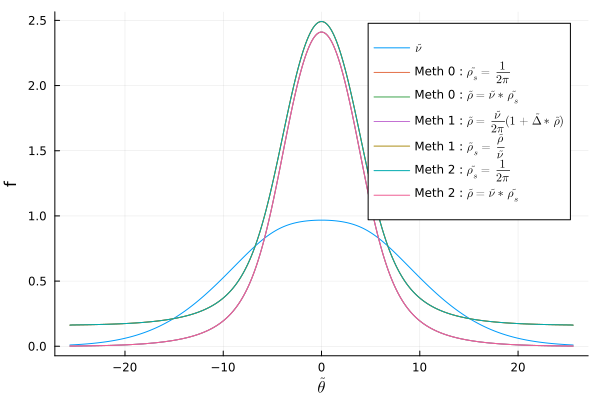

  0.010611 seconds (21 allocations: 11.464 MiB)
saved : test/rho_s_discr_ih1_42.616_730.000.npz
  0.000020 seconds (3 allocations: 4.125 KiB)
saved : test/rho_discr_ih1_42.616_730.000.npz
  3.050935 seconds (96.04 M allocations: 2.277 GiB, 20.00% gc time)
saved : test/theta_edge_1.0_ih1_42.616_730.000.npz
  0.000014 seconds (265 allocations: 12.266 KiB)
saved : test/nu_theta_edge_1.0_discr_ih1_42.616_730.000.npz
veff (1.221) = 0.000
veff (0.051) = -0.999
veff (0.154) = -0.912
veff (0.257) = -0.824
veff (0.359) = -0.737
veff (0.462) = -0.649
veff (0.564) = -0.562
veff (0.667) = -0.474
veff (0.770) = -0.386
veff (0.872) = -0.299
veff (0.975) = -0.211
veff (1.077) = -0.123
veff (1.180) = -0.035
veff (1.283) = 0.053
veff (1.385) = 0.142
veff (1.488) = 0.230
veff (1.590) = 0.319
veff (1.693) = 0.407
veff (1.796) = 0.496
veff (1.898) = 0.585
veff (2.001) = 0.675
veff (2.103) = 0.764
veff (2.206) = 0.854
veff (2.309) = 0.944
theta_star = 1.221 
  0.011494 seconds (21 allocations: 11.464 MiB, 

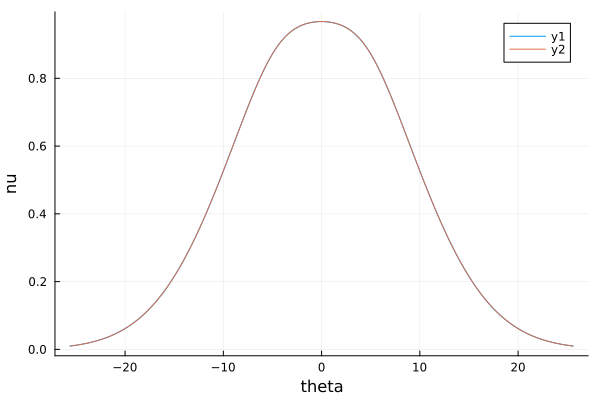

t = 0.000 saved
saved : test/density_expansion_nu_theta_edge_1.0_ih1_42.616_730.000_54.000_0.000.npz
saved : test/bord_theta_edge_1.0_ih1_42.616_730.000_54.000_0.000.npz


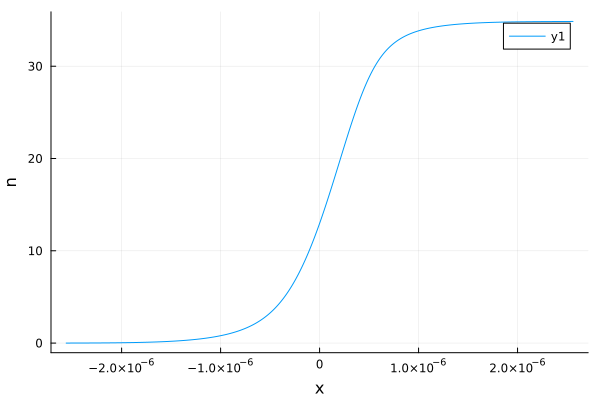

t = dt
t = 0.500 saved
saved : test/density_expansion_nu_theta_edge_1.0_ih1_42.616_730.000_54.000_0.500.npz
saved : test/bord_theta_edge_1.0_ih1_42.616_730.000_54.000_0.500.npz


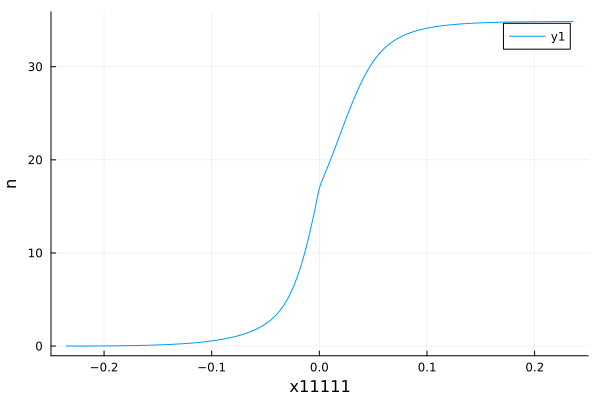

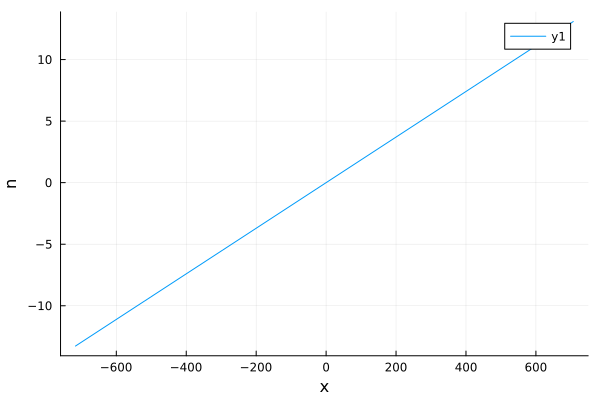

(500,)


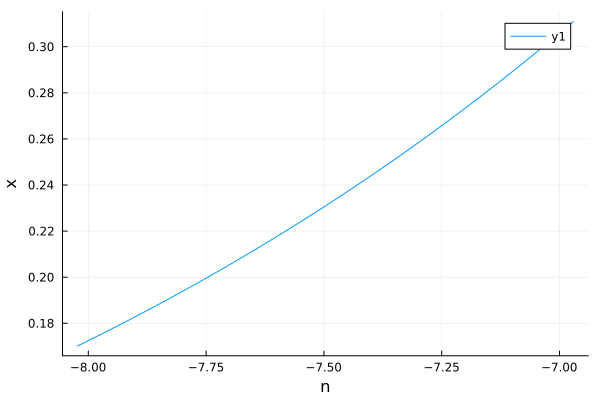

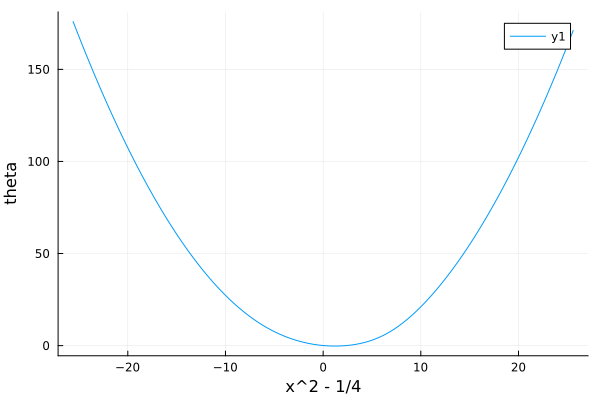

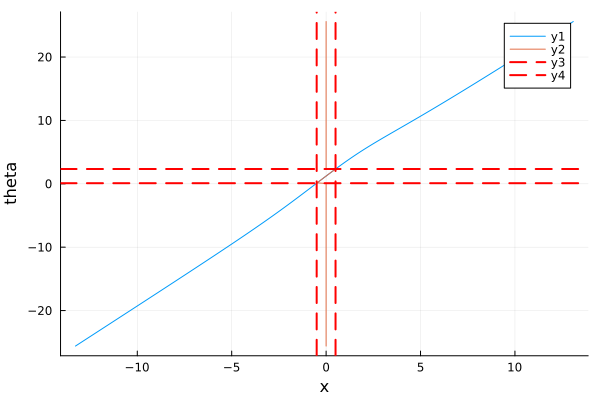

ih2
saved : test/theta_discr_ih2_42.616_730.000_54.000_28.000.npz
saved : test/x_ih2_42.616_730.000_54.000_28.000.npz.npz


┌ Warning: Duplicated knots were deduplicated. Use Interpolations.deduplicate_knots!(knots) explicitly to avoid this warning.
│   k1 =
│    1000-element Vector{Float64}:
│     -20.0
│     -19.959729445989176
│     -19.919458891978355
│     -19.87918833796753
│     -19.83891778395671
│       ⋮
│       2.314502844908886
│       2.318986676006883
│       2.32347050710488
│       2.3279543382028773
│       2.332438169300874
└ @ Interpolations ~/.julia/packages/Interpolations/u7CND/src/gridded/gridded.jl:77


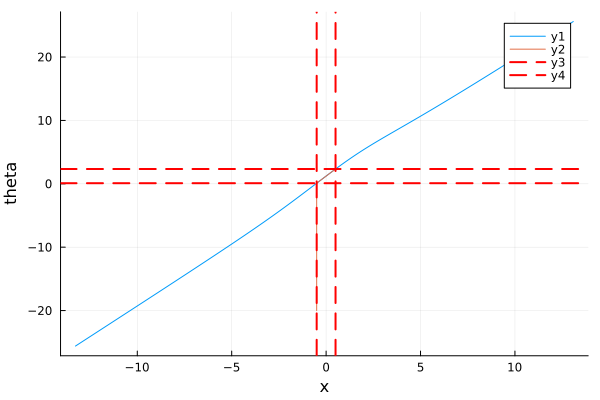

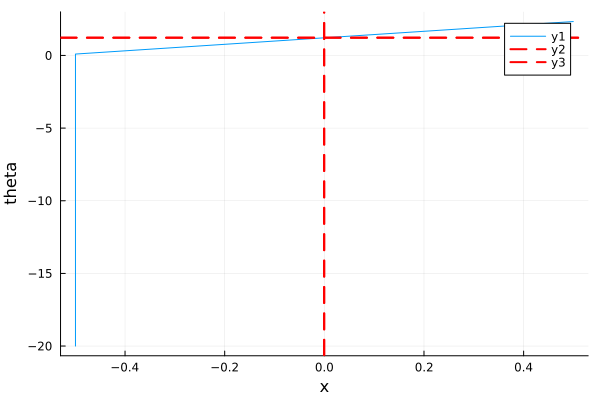

saved : test/theta_discr_ih2.npz
  0.015246 seconds (1.75 k allocations: 8.830 MiB)
size : 500
saved : test/nu_discr_ih2_42.616_730.000.npz


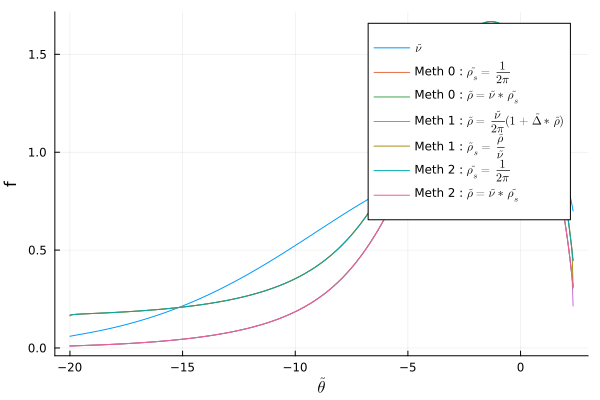

  0.006888 seconds (21 allocations: 11.464 MiB)
saved : test/rho_s_discr_ih2_42.616_730.000.npz
  0.000014 seconds (3 allocations: 4.125 KiB)
saved : test/rho_discr_ih2_42.616_730.000.npz
  2.957971 seconds (96.06 M allocations: 2.278 GiB, 19.45% gc time)
saved : test/theta_edge_1.0_ih2_42.616_730.000.npz
  0.000013 seconds (474 allocations: 15.531 KiB)
saved : test/nu_theta_edge_1.0_discr_ih2_42.616_730.000.npz
veff (1.066) = -0.000
veff (-0.040) = -0.990
veff (0.005) = -0.950
veff (0.050) = -0.911
veff (0.095) = -0.871
veff (0.139) = -0.831
veff (0.184) = -0.792
veff (0.229) = -0.752
veff (0.274) = -0.712
veff (0.318) = -0.672
veff (0.363) = -0.633
veff (0.408) = -0.593
veff (0.453) = -0.553
veff (0.498) = -0.513
veff (0.542) = -0.473
veff (0.587) = -0.433
veff (0.632) = -0.392
veff (0.677) = -0.352
veff (0.721) = -0.312
veff (0.766) = -0.272
veff (0.811) = -0.231
veff (0.856) = -0.191
veff (0.900) = -0.150
veff (0.945) = -0.110
veff (0.990) = -0.069
veff (1.035) = -0.029
veff (1.079

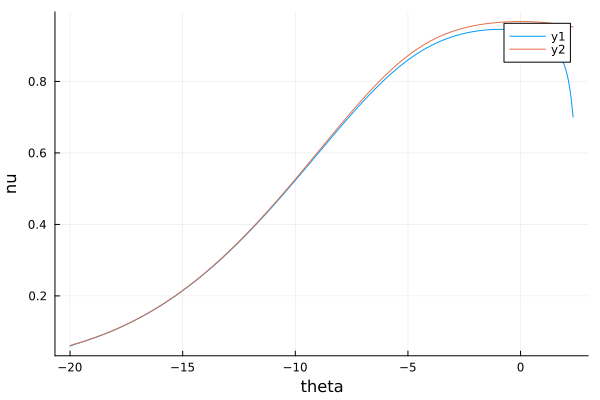

t = 0.000 saved
saved : test/density_expansion_nu_theta_edge_1.0_ih2_42.616_730.000_54.000_0.000.npz
saved : test/bord1_theta_edge_1.0_ih2_42.616_730.000_54.000_0.000.npz
saved : test/bord2_theta_edge_1.0_ih2_42.616_730.000_54.000_0.000.npz


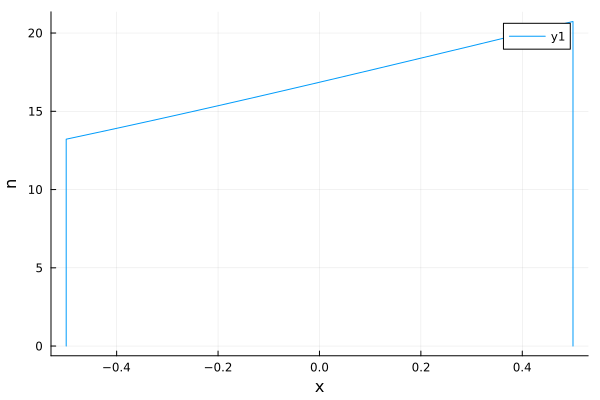

t = 0.000 
t = 1.000 saved
saved : test/density_expansion_nu_theta_edge_1.0_ih2_42.616_730.000_54.000_1.000.npz
saved : test/bord1_theta_edge_1.0_ih2_42.616_730.000_54.000_1.000.npz
saved : test/bord2_theta_edge_1.0_ih2_42.616_730.000_54.000_1.000.npz
t = 1.100 saved
saved : test/density_expansion_nu_theta_edge_1.0_ih2_42.616_730.000_54.000_1.100.npz
saved : test/bord1_theta_edge_1.0_ih2_42.616_730.000_54.000_1.100.npz
saved : test/bord2_theta_edge_1.0_ih2_42.616_730.000_54.000_1.100.npz


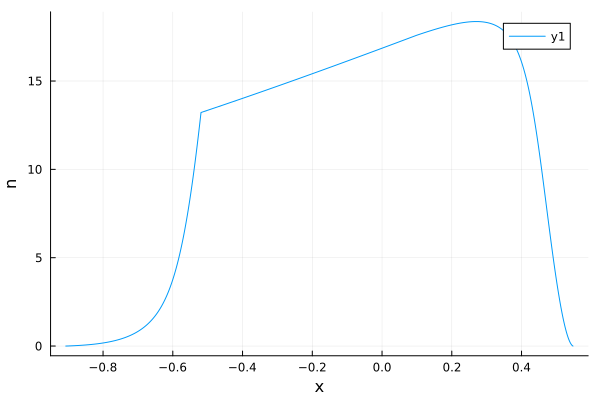

([-0.9069067446831212, -0.9059973491788144, -0.9050917547108988, -0.904188392822152, -0.9032859170338514, -0.9023835377992422, -0.9014808852376783, -0.9005778201959695, -0.8996743136817446, -0.898770384219209  …  0.5413473921716542, 0.5420327955713068, 0.5420750601340055, 0.542805915889959, 0.5435416514310245, 0.5442849994447068, 0.545041024946201, 0.545819310426423, 0.5466363385305094, 0.5475128626184643], [0.0, 0.0006043346077463802, 0.0012224241212755265, 0.0018537255267969692, 0.002497469441042051, 0.0031530429062075894, 0.003819880805293891, 0.004497691648534007, 0.005186184419574345, 0.005885251296448106  …  0.13275699126602875, 0.11126309623305734, 0.10996080066113657, 0.08851920022622434, 0.06895581709639373, 0.05130901864595861, 0.03561186856416424, 0.021876148036398372, 0.01005695616909309, 0.0])

In [68]:
function pre_model_fit_inhomo(new_date , nom,  theta_discr, n_p , mup ,  T , Taille , gbar )
    
    calcule_deformation = 1 == 1 # si on veut calculer les deformations
    fit_deformation = 0 == 1 # si on veut fiter la deformation
    
    calcule_expension = 1 == 1 # Si on veut fair les clacule GHD d'expension 
    fit_expension = 1 == 1 # si on veut faire un fit sur l'expension 
    
    nom = "theta_edge_1.0_ih1"
    
    if calcule_deformation
        
        
        theta_discr , nu_discr , rho_s_discr , rho_discr , theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )

        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
        filename1 = @sprintf "%s/nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)

        function edge_expansion(n_fun, dt, list_t_save, theta_max, npts, gb, ratio_m_hbar)
            tmax = maximum(list_t_save)
            theta_tab = LinRange(-theta_max, theta_max, npts)
            x = 0.0000001*theta_tab

            t = 0
            mydensity = eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
            println(@sprintf "t = %.3f saved" t*Taille)
            filename = filename0 * @sprintf("%.3f.npz", Float64(t))
            println("saved : ", filename)
            npzwrite(filename, mydensity)
            filename = @sprintf "%s/bord_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
            println("saved : ", filename)
            npzwrite(filename, x)

            #filename = filename1 * @sprintf("%.3f.npz", Float64(t*Taille))
            #println("saved : ", filename)
            #println("Taille de nu : ", size(nu))
            #println("Type de nu : ", typeof(nu))

            #nu = map(x -> Float64(x), nu)
            #npzwrite(filename, map(x -> Float64(x), nu))

            p = plot(xlabel="x", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)
            while t<=tmax && 1 == 0 
                x = evol_edge_expansion(dt, x , gb, theta_tab, n_fun)
                t += dt

                for ts in list_t_save
                    if ts - 0.0001/Taille <= t < (ts + dt) + 0.0001/Taille
                        mydensity = eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
                        println(@sprintf "t = %.3f saved" t*Taille)
                        filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                        println("saved : ", filename)
                        npzwrite(filename, mydensity)
                        filename = @sprintf "%s/bord_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
                        println("saved : ", filename)
                        npzwrite(filename, x)

                    end
                end
            end
            if 1 == 1 
                t = dt 
                println("t = dt")
                x += veff(gbar, theta_discr, nu_theta_star_discr)*t
                mydensity = eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
                println(@sprintf "t = %.3f saved" t*Taille)
                filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                println("saved : ", filename)
                npzwrite(filename, mydensity)
                filename = @sprintf "%s/bord_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
                println("saved : ", filename)
                npzwrite(filename, x)
            end 
            p = plot(xlabel="x11111", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)
        end

        # Créer l'interpolation
        nu_fun = LinearInterpolation(theta_discr, nu_discr)

        # Afficher l'interpolation
        p = plot(xlabel="theta", ylabel="nu", legend=:topright)
        plot!(p, theta_discr,  nu_discr )
        plot!(p, theta_discr, nu_fun(theta_discr))
        display(p)

        temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille ]
        temps_sav = [ 0.1/Taille, 0.5/Taille, 1/Taille, 5/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 18.0/Taille]
        #temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 18/Taille , 28/Taille ]
        temps_sav = [ 1/Taille]
        dt = 0.5/Taille
        edge_expansion(nu_fun, dt ,temps_sav  , theta_max , npts , gbar, mass/hbar)

        ###Coupure de taile $\ell$ + evolution
        t = 28/Taille
        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
        filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
        #filename = @sprintf "%s/density_expansion_nu_edge_julia_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
        density = npzread(filename)

        t_deforme = 28/Taille
        # on coupe où (x/\ell)^2 > 1/4 
        x1 = density[1,:]*t_deforme/t 
        
        p = plot(ylabel="n", xlabel="x", legend=:topright)
        plot!(p,  x1*Taille , density[1,:])
        display(p)
        
        if fit_deformation 
            return x1 , density[2,:] 
        end
    end 
    
    if calcule_expension 
    
        ###Coupure de taile $\ell$ + evolution
        #t = 1/Taille
        #filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
        #filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
        #filename = @sprintf "%s/density_expansion_nu_edge_julia_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
        #density = npzread(filename)

        #t_deforme = 28/Taille
        # on coupe où (x/\ell)^2 > 1/4 
        #x1 = density[1,:]*t_deforme/t    

        println( size(x1))
        y1 = density[2,:]
        g , d  = 110 - 10 , 110+10
        p = plot(ylabel="x", xlabel="n", legend=:topright)
        plot!(p,  x1[g:d] , y1[g:d])
        display(p)
        x_fun = LinearInterpolation(theta_discr,x1)
        theta_fun = LinearInterpolation(x1, theta_discr)
        x_squared = x1 .^ 2
        x_squared_fun = LinearInterpolation(theta_discr, x_squared)

        f = LinearInterpolation(theta_discr, x_squared)
        f = theta -> linear_interpolation(theta_discr, x_squared.-1/4)(theta)
        p = plot(ylabel="theta", xlabel="x^2 - 1/4", legend=:topright)
        plot!(p,  theta_discr , f(theta_discr))
        display(p)
        theta_1 = fzero(f, theta_discr[1] , theta_fun(0))
        theta_2 = fzero(f, theta_fun(0) , last(theta_discr))

        x2 = ifelse.(x_squared .> 1/4, 0, x1)

        p = plot(ylabel="theta", xlabel="x", legend=:topright)
        plot!(p,  x1 , theta_discr)
        plot!(p,  x2 , theta_discr)
        vline!(p, [x_fun(theta_1), x_fun(theta_2)], linestyle=:dash, color=:red, linewidth=2)
        hline!(p, [theta_1, theta_2], linestyle=:dash, color=:red, linewidth=2)
        display(p)

        #npts = 200
        theta_discr_2 = LinRange(theta_1, theta_2 , npts)
        max_abs_theta = maximum(abs.(theta_discr_2))
        max_abs_theta = maximum([20 , max_abs_theta])
        theta_discr_gauche = LinRange(-max_abs_theta, theta_1 , npts)
        theta_discr_2 = cat(theta_discr_gauche, theta_discr_2, dims=1)

        nom = "theta_edge_1.0_ih2"
        index_last_underscore = findlast(isequal('_'), nom)
        println(nom[index_last_underscore+1:end])

        ## bord gauche 
        x_2 = cat(x_fun(theta_1) * ones(size(theta_discr_gauche)[1]) , LinRange(x_fun(theta_1), x_fun(theta_2) , npts) , dims = 1 )
        x_2_fun = LinearInterpolation(theta_discr_2, x_2)
        theta_discr_2 = LinRange(theta_discr_2[1], last(theta_discr_2) , npts)
        x_2 = x_2_fun(theta_discr_2)
        filename = @sprintf "%s/theta_discr_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
        npzwrite(filename, theta_discr_2 )
        println("saved : ", filename)
        filename = @sprintf "%s/x_%s_%.3f_%.3f_%.3f_%.3f.npz.npz" new_date nom[index_last_underscore+1:end] Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
        npzwrite(filename, x_2 )
        println("saved : ", filename)



        p = plot(ylabel="theta", xlabel="x", legend=:topright)
        plot!(p,  x1 , theta_discr)
        plot!(p,  x_2 , theta_discr_2)
        vline!(p, [x_fun(theta_1), x_fun(theta_2)], linestyle=:dash, color=:red, linewidth=2)
        hline!(p, [theta_1, theta_2], linestyle=:dash, color=:red, linewidth=2)
        display(p)

        p = plot(ylabel="theta", xlabel="x", legend=:topright)
        plot!(p,  x_2 , theta_discr_2)
        vline!(p, [0 , x_fun(theta_star)], linestyle=:dash, color=:red, linewidth=2)
        hline!(p, [theta_fun(0) , theta_star], linestyle=:dash, color=:red, linewidth=2)
        display(p)

        #save_nu_rho_rho_s(new_date , nom , theta_discr_2, n_p , mup , T , Taille , gbar )
        theta_discr , nu_discr , rho_s_discr , rho_discr , theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = save_nu_rho_rho_s(new_date , nom , theta_discr_2, n_p , mup ,  T , Taille , gbar )


        #println( mup )
        filename0 = @sprintf "%s/density_expansion_nu_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
        filename0 = @sprintf "%s/density_expansion_nu_theta_edge_2_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)


        function box_expansion(n_fun,theta_tab, x, dt, list_t_save,  npts, gb, ratio_m_hbar)
            tmax = maximum(list_t_save)
            x1 = x + 0.0000001*theta_tab
            x2 = 0.5 * ones(npts) + 0.0000001*theta_tab

            t = 0

            mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
            println(@sprintf "t = %.3f saved" t*Taille)
            filename = filename0 * @sprintf("%.3f.npz", Float64(t))
            println("saved : ", filename)
            npzwrite(filename, mydensity)
            filename = @sprintf "%s/bord1_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
            println("saved : ", filename)
            npzwrite(filename, x1)
            filename = @sprintf "%s/bord2_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
            println("saved : ", filename)
            npzwrite(filename, x2)

            p = plot(xlabel="x", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)

            println(@sprintf "t = %.3f " t*Taille)
            while t<=tmax

                x1, x2 = evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
                t += dt


                #println(@sprintf "t = %.3f " t*Taille)

                for ts in list_t_save
                    if ts - 0.0001/Taille <= t < (ts + dt) + 0.0001/Taille
                        #println( ts , t , ts+dt )
                        mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
                        println(@sprintf "t = %.3f saved" t*Taille)
                        filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                        println("saved : ", filename)
                        npzwrite(filename, mydensity)
                        filename = @sprintf "%s/bord1_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
                        println("saved : ", filename)
                        npzwrite(filename, x1)
                        filename = @sprintf "%s/bord2_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
                        println("saved : ", filename)
                        npzwrite(filename, x2)
                        #p = plot(xlabel="x", ylabel="n", legend=:topright)
                        #plot!(p, mydensity[1,:],  mydensity[2,:] )
                        #display(p)
                    end
                end

            end
            p = plot(xlabel="x", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)

            return mydensity[1,:],  mydensity[2,:]
        end

        p = plot(xlabel="theta", ylabel="nu", legend=:topright)
        plot!(p, theta_discr,  nu_discr )
        plot!(p, theta_discr, nu_fun(theta_discr))
        display(p)

        temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille ,51.0/Taille ]
        temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
        #temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille , 100.0/Taille ,200.0/Taille,300.0/Taille,400.0/Taille , 500.0/Taille  ]
        temps_sav = [1/Taille]
        dt = 0.1/Taille

        if fit_expension 
            return box_expansion(nu_fun, theta_discr_2 , x_2 , dt ,temps_sav  , npts , gbar, mass/hbar)
        end

    end
end 

new_date = "test"
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)
pre_model_fit_inhomo(new_date , nom,  theta_discr, "None" , mup ,  T , Taille , gbar )

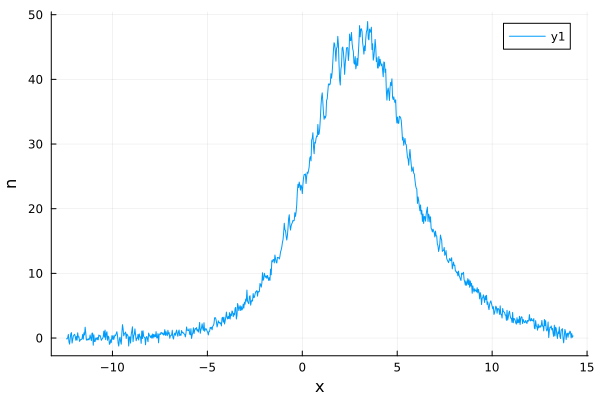

size x dat :(815,)
size(p0) : (1,)
lower_bounds = [365.3065](1,)
upper_bounds = [1095.9195](1,)
3
size x_data : (815,)
size y_data : (815,)
mup = 42.61559255715252
T = 730.613
saved : ultime_test/theta_discr_ih1.npz
  0.012252 seconds (3.62 k allocations: 6.542 MiB)
size : 200
saved : ultime_test/nu_discr_ih1_42.616_730.613.npz


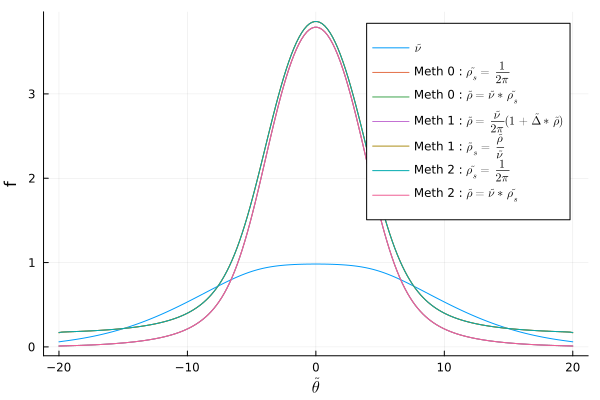

  0.001826 seconds (21 allocations: 1.840 MiB)
saved : ultime_test/rho_s_discr_ih1_42.616_730.613.npz
  0.000022 seconds (3 allocations: 1.828 KiB)
saved : ultime_test/rho_discr_ih1_42.616_730.613.npz
  0.512044 seconds (15.38 M allocations: 374.008 MiB, 10.63% gc time)
saved : ultime_test/theta_edge_1.0_ih1_42.616_730.613.npz
  0.000007 seconds (111 allocations: 5.266 KiB)
saved : ultime_test/nu_theta_edge_1.0_discr_ih1_42.616_730.613.npz
veff (1.539) = 0.000
veff (0.302) = -0.990
veff (0.503) = -0.829
veff (0.704) = -0.669
veff (0.905) = -0.508
veff (1.106) = -0.347
veff (1.307) = -0.186
veff (1.508) = -0.025
veff (1.709) = 0.136
veff (1.910) = 0.298
veff (2.111) = 0.460
veff (2.312) = 0.623
veff (2.513) = 0.786
veff (2.714) = 0.951
theta_star = 1.539 
  0.003378 seconds (21 allocations: 1.840 MiB)
saved : ultime_test/rho_s_theta_edge_1.0_discr_ih1_42.616_730.613.npz
  0.000013 seconds (3 allocations: 1.828 KiB)
saved : ultime_test/rho_theta_edge_1.0_discr_ih1_42.616_730.613.npz


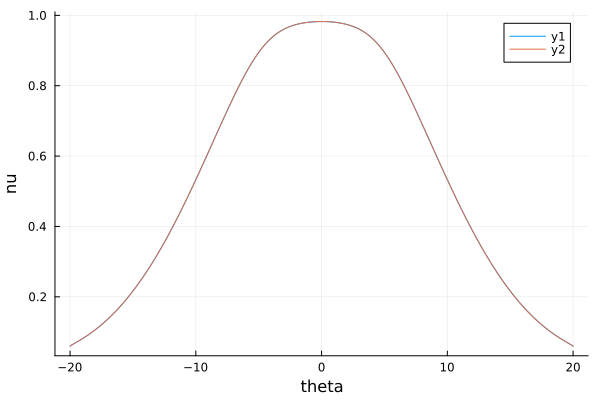

t = 0.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_42.616_730.613_54.000_0.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_42.616_730.613_54.000_0.000.npz


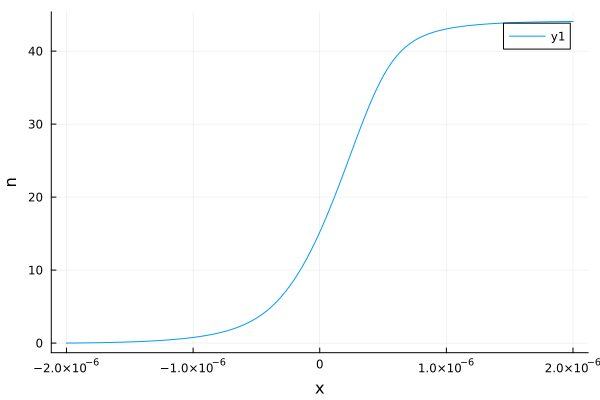

t = 1.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_42.616_730.613_54.000_1.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_42.616_730.613_54.000_1.000.npz
t = 2.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_42.616_730.613_54.000_2.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_42.616_730.613_54.000_2.000.npz


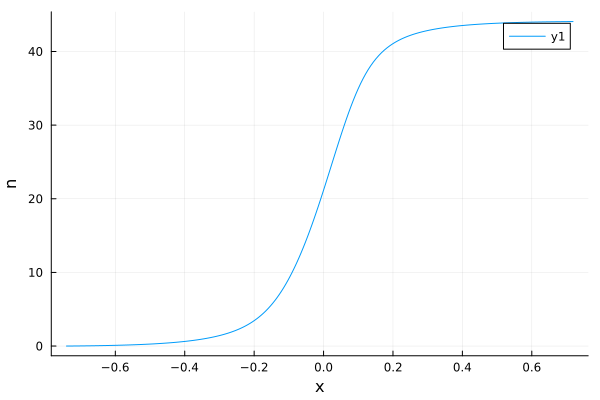

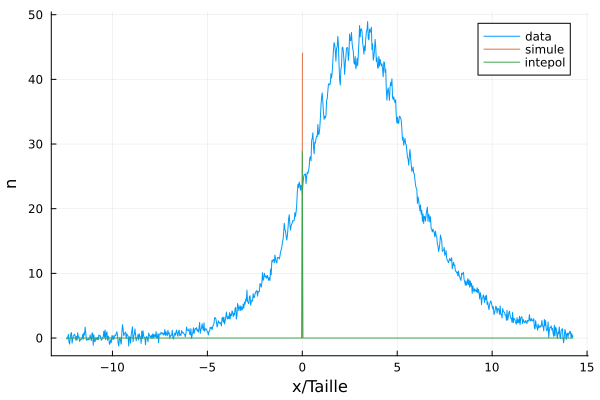

mup = 42.61559255715252
T = 730.613
saved : ultime_test/theta_discr_ih1.npz
  0.013559 seconds (3.62 k allocations: 6.542 MiB)
size : 200
saved : ultime_test/nu_discr_ih1_42.616_730.613.npz


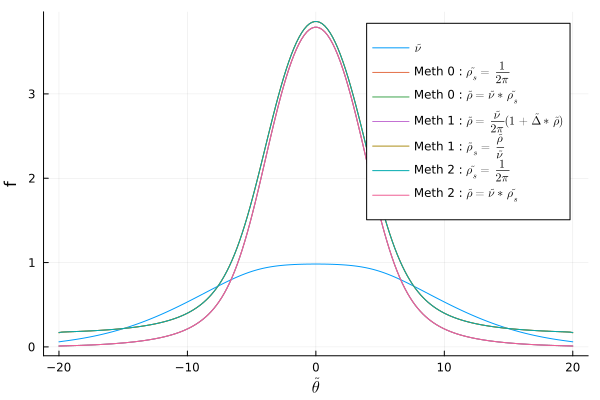

  0.001999 seconds (21 allocations: 1.840 MiB)
saved : ultime_test/rho_s_discr_ih1_42.616_730.613.npz
  0.000021 seconds (3 allocations: 1.828 KiB)
saved : ultime_test/rho_discr_ih1_42.616_730.613.npz
  0.470643 seconds (15.38 M allocations: 374.008 MiB, 11.36% gc time)
saved : ultime_test/theta_edge_1.0_ih1_42.616_730.613.npz
  0.000007 seconds (111 allocations: 5.266 KiB)
saved : ultime_test/nu_theta_edge_1.0_discr_ih1_42.616_730.613.npz
veff (1.539) = 0.000
veff (0.302) = -0.990
veff (0.503) = -0.829
veff (0.704) = -0.669
veff (0.905) = -0.508
veff (1.106) = -0.347
veff (1.307) = -0.186
veff (1.508) = -0.025
veff (1.709) = 0.136
veff (1.910) = 0.298
veff (2.111) = 0.460
veff (2.312) = 0.623
veff (2.513) = 0.786
veff (2.714) = 0.951
theta_star = 1.539 
  0.001360 seconds (21 allocations: 1.840 MiB)
saved : ultime_test/rho_s_theta_edge_1.0_discr_ih1_42.616_730.613.npz
  0.000012 seconds (3 allocations: 1.828 KiB)
saved : ultime_test/rho_theta_edge_1.0_discr_ih1_42.616_730.613.npz


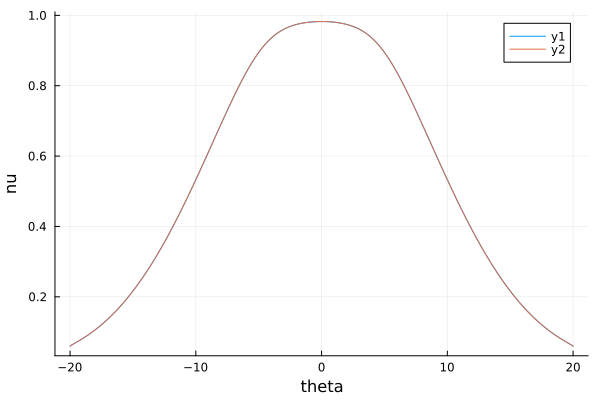

t = 0.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_42.616_730.613_54.000_0.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_42.616_730.613_54.000_0.000.npz


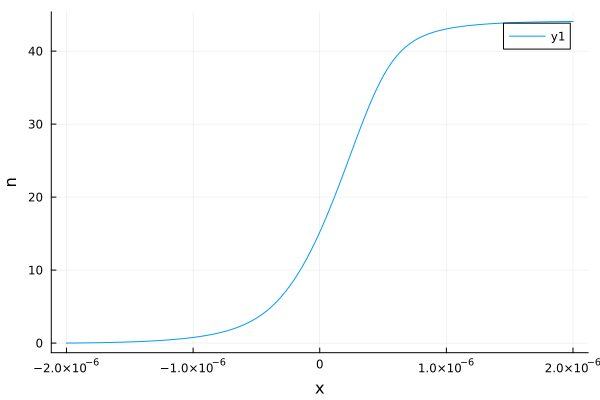

t = 1.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_42.616_730.613_54.000_1.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_42.616_730.613_54.000_1.000.npz
t = 2.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_42.616_730.613_54.000_2.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_42.616_730.613_54.000_2.000.npz


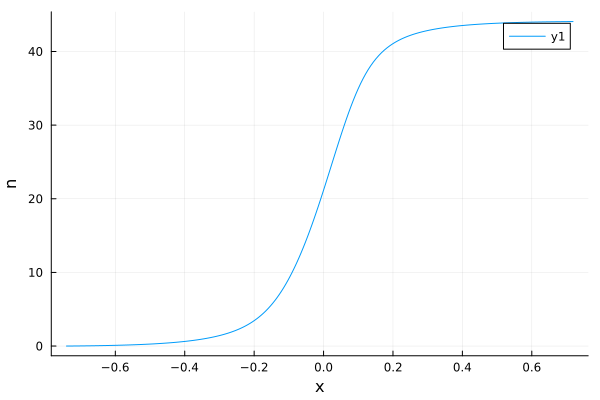

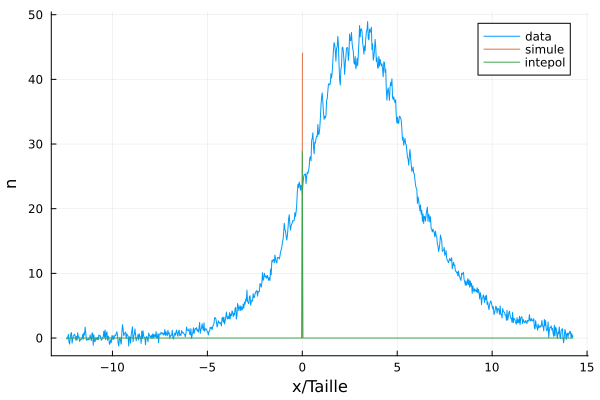

mup = 42.61542729941005
T = 730.6174241937439
saved : ultime_test/theta_discr_ih1.npz
  0.010277 seconds (3.62 k allocations: 6.542 MiB)
size : 200
saved : ultime_test/nu_discr_ih1_42.615_730.617.npz


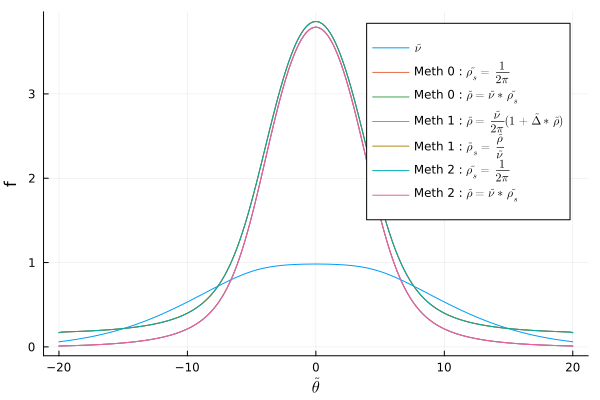

  0.001788 seconds (21 allocations: 1.840 MiB)
saved : ultime_test/rho_s_discr_ih1_42.615_730.617.npz
  0.000017 seconds (3 allocations: 1.828 KiB)
saved : ultime_test/rho_discr_ih1_42.615_730.617.npz
  0.487624 seconds (15.38 M allocations: 374.008 MiB, 9.83% gc time)
saved : ultime_test/theta_edge_1.0_ih1_42.615_730.617.npz
  0.000007 seconds (111 allocations: 5.266 KiB)
saved : ultime_test/nu_theta_edge_1.0_discr_ih1_42.615_730.617.npz
veff (1.539) = -0.000
veff (0.302) = -0.990
veff (0.503) = -0.829
veff (0.704) = -0.669
veff (0.905) = -0.508
veff (1.106) = -0.347
veff (1.307) = -0.186
veff (1.508) = -0.025
veff (1.709) = 0.136
veff (1.910) = 0.298
veff (2.111) = 0.460
veff (2.312) = 0.623
veff (2.513) = 0.786
veff (2.714) = 0.951
theta_star = 1.539 
  0.001575 seconds (21 allocations: 1.840 MiB)
saved : ultime_test/rho_s_theta_edge_1.0_discr_ih1_42.615_730.617.npz
  0.000012 seconds (3 allocations: 1.828 KiB)
saved : ultime_test/rho_theta_edge_1.0_discr_ih1_42.615_730.617.npz


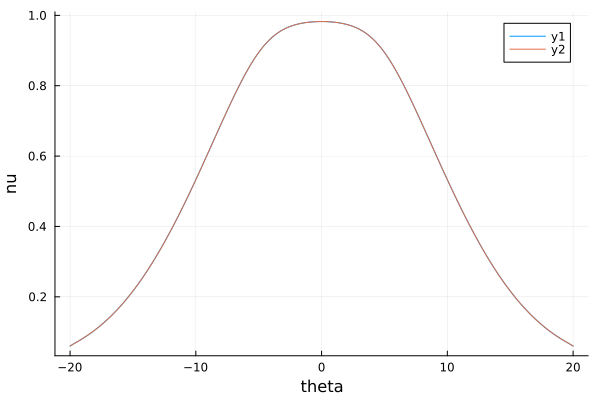

t = 0.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_42.615_730.617_54.000_0.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_42.615_730.617_54.000_0.000.npz


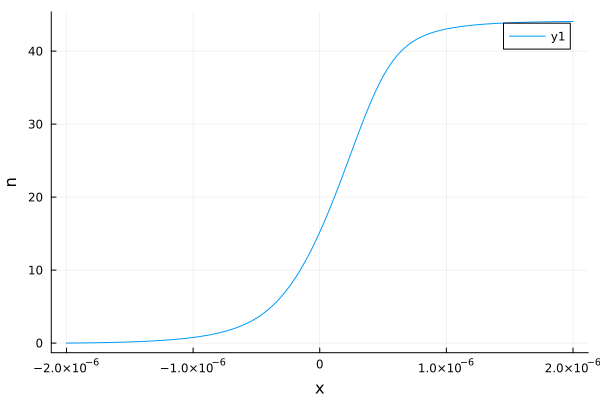

t = 1.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_42.615_730.617_54.000_1.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_42.615_730.617_54.000_1.000.npz
t = 2.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_42.615_730.617_54.000_2.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_42.615_730.617_54.000_2.000.npz


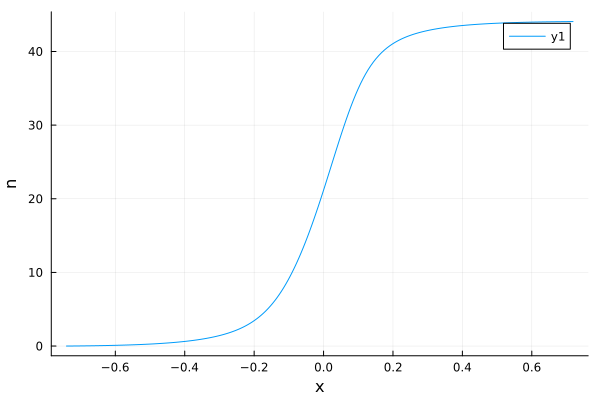

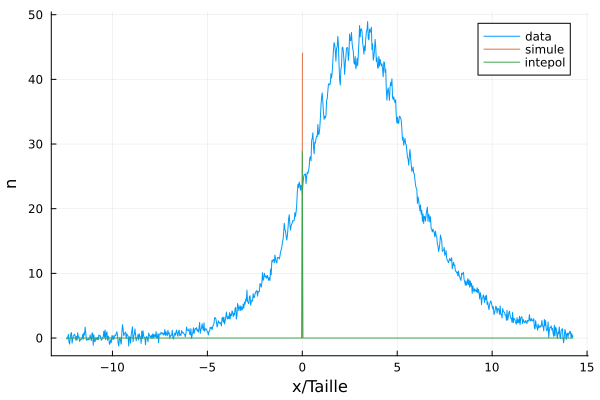

mup = 42.61575781347529
T = 730.6085758062562
saved : ultime_test/theta_discr_ih1.npz
  0.017623 seconds (3.62 k allocations: 6.542 MiB)
size : 200
saved : ultime_test/nu_discr_ih1_42.616_730.609.npz


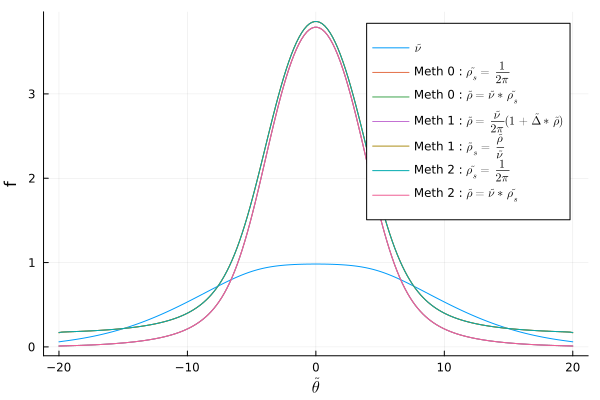

  0.013106 seconds (21 allocations: 1.840 MiB)
saved : ultime_test/rho_s_discr_ih1_42.616_730.609.npz
  0.000025 seconds (3 allocations: 1.828 KiB)
saved : ultime_test/rho_discr_ih1_42.616_730.609.npz
  1.029931 seconds (15.38 M allocations: 374.008 MiB, 7.07% gc time)
saved : ultime_test/theta_edge_1.0_ih1_42.616_730.609.npz
  0.000015 seconds (111 allocations: 5.266 KiB)
saved : ultime_test/nu_theta_edge_1.0_discr_ih1_42.616_730.609.npz
veff (1.539) = 0.000
veff (0.302) = -0.990
veff (0.503) = -0.829
veff (0.704) = -0.669
veff (0.905) = -0.508
veff (1.106) = -0.347
veff (1.307) = -0.186
veff (1.508) = -0.025
veff (1.709) = 0.136
veff (1.910) = 0.298
veff (2.111) = 0.460
veff (2.312) = 0.623
veff (2.513) = 0.786
veff (2.714) = 0.951
theta_star = 1.539 
  0.002503 seconds (21 allocations: 1.840 MiB)
saved : ultime_test/rho_s_theta_edge_1.0_discr_ih1_42.616_730.609.npz
  0.000020 seconds (3 allocations: 1.828 KiB)
saved : ultime_test/rho_theta_edge_1.0_discr_ih1_42.616_730.609.npz


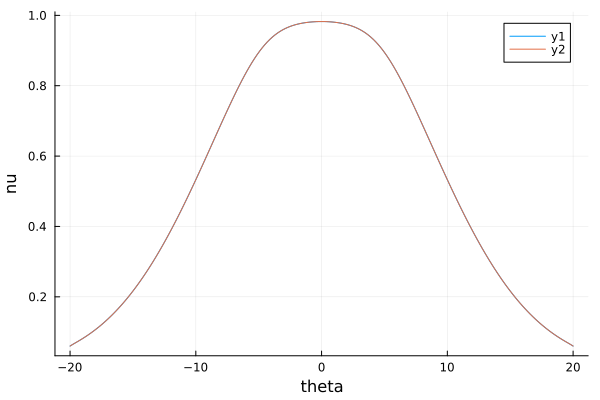

t = 0.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_42.616_730.609_54.000_0.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_42.616_730.609_54.000_0.000.npz


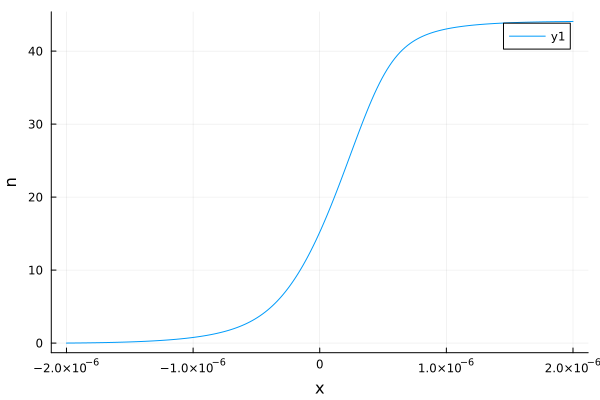

t = 1.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_42.616_730.609_54.000_1.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_42.616_730.609_54.000_1.000.npz
t = 2.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_42.616_730.609_54.000_2.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_42.616_730.609_54.000_2.000.npz


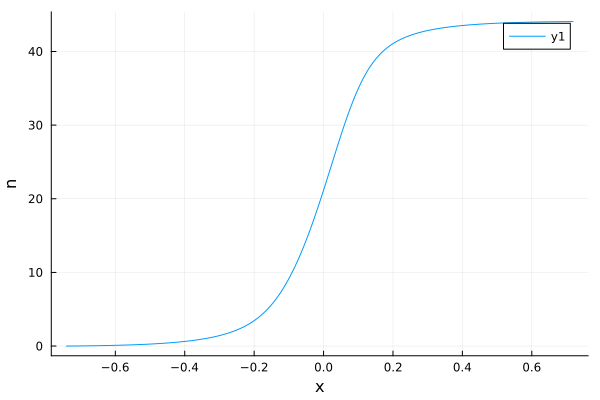

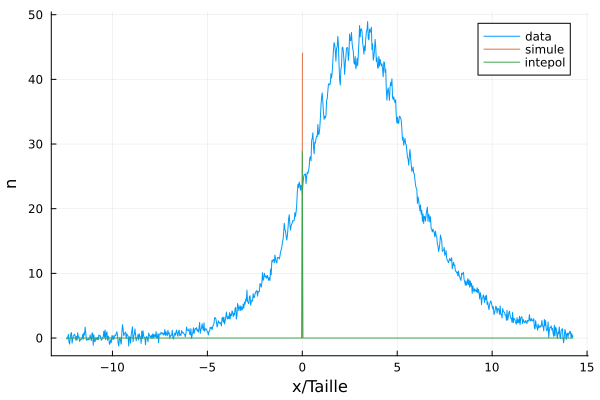

mup = 28.47584187717128
T = 1031.134902849951
saved : ultime_test/theta_discr_ih1.npz
  0.021061 seconds (3.26 k allocations: 5.921 MiB)
size : 200
saved : ultime_test/nu_discr_ih1_28.476_1031.135.npz


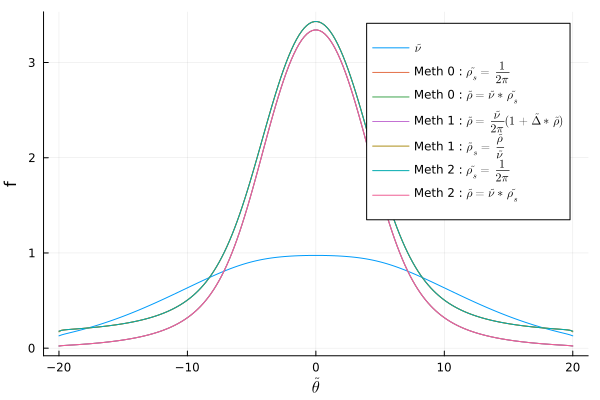

  0.002040 seconds (21 allocations: 1.840 MiB)
saved : ultime_test/rho_s_discr_ih1_28.476_1031.135.npz
  0.000033 seconds (3 allocations: 1.828 KiB)
saved : ultime_test/rho_discr_ih1_28.476_1031.135.npz
  1.034486 seconds (15.38 M allocations: 374.008 MiB, 8.68% gc time)
saved : ultime_test/theta_edge_1.0_ih1_28.476_1031.135.npz
  0.000014 seconds (111 allocations: 5.266 KiB)
saved : ultime_test/nu_theta_edge_1.0_discr_ih1_28.476_1031.135.npz
veff (1.520) = -0.000
veff (0.503) = -0.842
veff (0.704) = -0.676
veff (0.905) = -0.510
veff (1.106) = -0.344
veff (1.307) = -0.177
veff (1.508) = -0.011
veff (1.709) = 0.156
veff (1.910) = 0.324
veff (2.111) = 0.492
veff (2.312) = 0.661
veff (2.513) = 0.830
theta_star = 1.520 
  0.002495 seconds (21 allocations: 1.840 MiB)
saved : ultime_test/rho_s_theta_edge_1.0_discr_ih1_28.476_1031.135.npz
  0.000022 seconds (3 allocations: 1.828 KiB)
saved : ultime_test/rho_theta_edge_1.0_discr_ih1_28.476_1031.135.npz


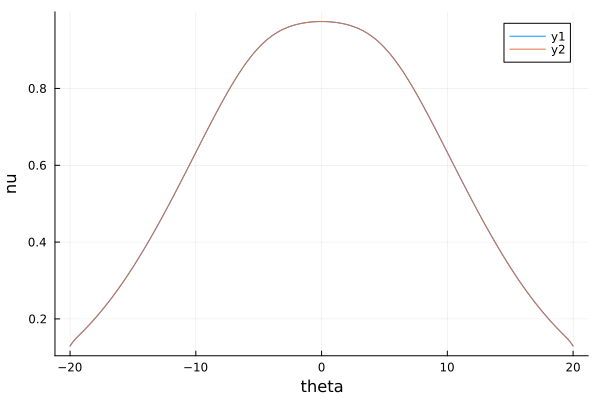

t = 0.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_28.476_1031.135_54.000_0.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_28.476_1031.135_54.000_0.000.npz


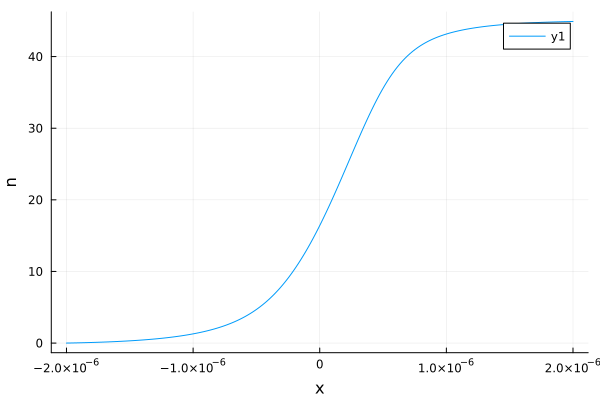

t = 1.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_28.476_1031.135_54.000_1.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_28.476_1031.135_54.000_1.000.npz
t = 2.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_28.476_1031.135_54.000_2.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_28.476_1031.135_54.000_2.000.npz


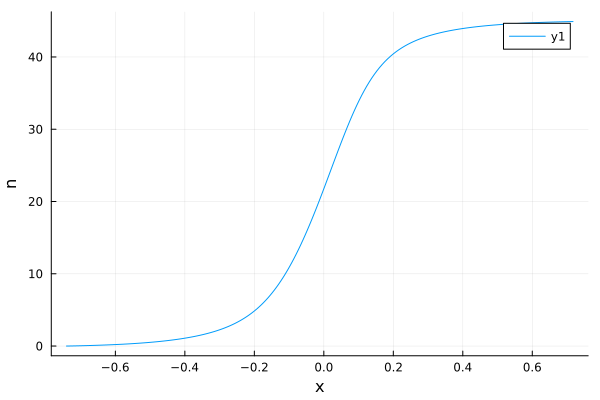

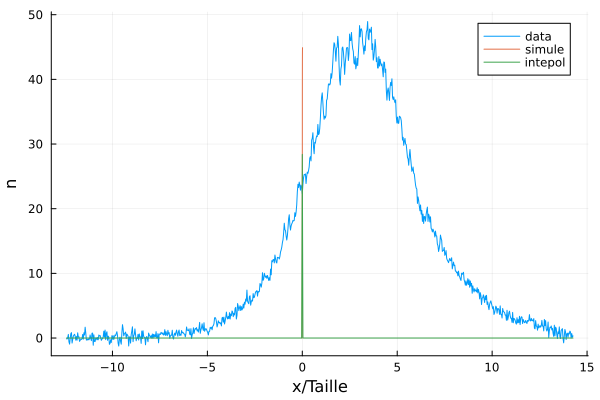

mup = 28.47584187717128
T = 1031.134902849951
saved : ultime_test/theta_discr_ih1.npz
  0.038199 seconds (3.26 k allocations: 5.921 MiB, 55.71% gc time)
size : 200
saved : ultime_test/nu_discr_ih1_28.476_1031.135.npz


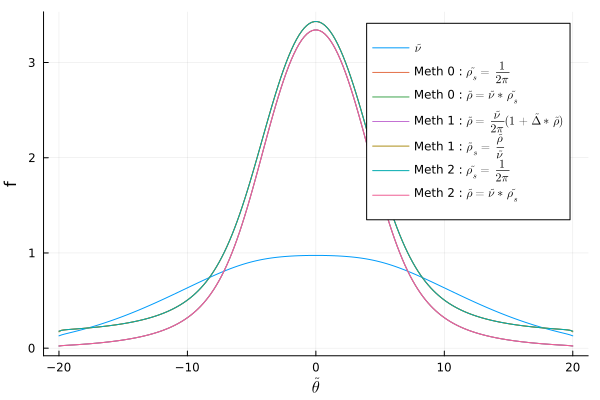

  0.002167 seconds (21 allocations: 1.840 MiB)
saved : ultime_test/rho_s_discr_ih1_28.476_1031.135.npz
  0.000024 seconds (3 allocations: 1.828 KiB)
saved : ultime_test/rho_discr_ih1_28.476_1031.135.npz
  1.035833 seconds (15.38 M allocations: 374.008 MiB, 7.31% gc time)
saved : ultime_test/theta_edge_1.0_ih1_28.476_1031.135.npz
  0.000015 seconds (111 allocations: 5.266 KiB)
saved : ultime_test/nu_theta_edge_1.0_discr_ih1_28.476_1031.135.npz
veff (1.520) = -0.000
veff (0.503) = -0.842
veff (0.704) = -0.676
veff (0.905) = -0.510
veff (1.106) = -0.344
veff (1.307) = -0.177
veff (1.508) = -0.011
veff (1.709) = 0.156
veff (1.910) = 0.324
veff (2.111) = 0.492
veff (2.312) = 0.661
veff (2.513) = 0.830
theta_star = 1.520 
  0.001536 seconds (21 allocations: 1.840 MiB)
saved : ultime_test/rho_s_theta_edge_1.0_discr_ih1_28.476_1031.135.npz
  0.000011 seconds (3 allocations: 1.828 KiB)
saved : ultime_test/rho_theta_edge_1.0_discr_ih1_28.476_1031.135.npz


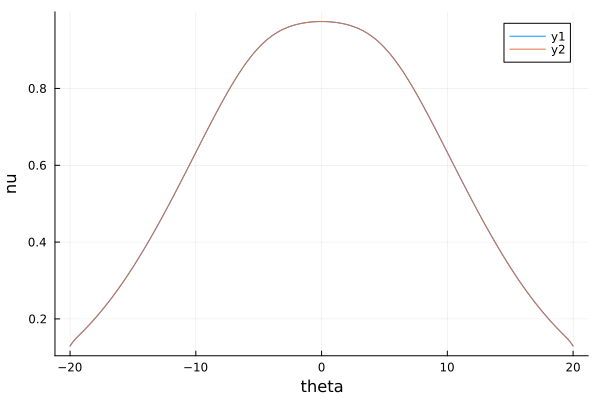

t = 0.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_28.476_1031.135_54.000_0.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_28.476_1031.135_54.000_0.000.npz


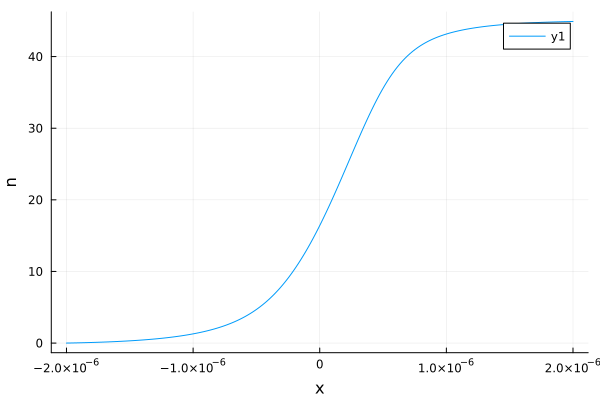

t = 1.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_28.476_1031.135_54.000_1.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_28.476_1031.135_54.000_1.000.npz
t = 2.000 saved
saved : ultime_test/density_expansion_nu_theta_edge_1.0_ih1_28.476_1031.135_54.000_2.000.npz
saved : ultime_test/bord_theta_edge_1.0_ih1_28.476_1031.135_54.000_2.000.npz


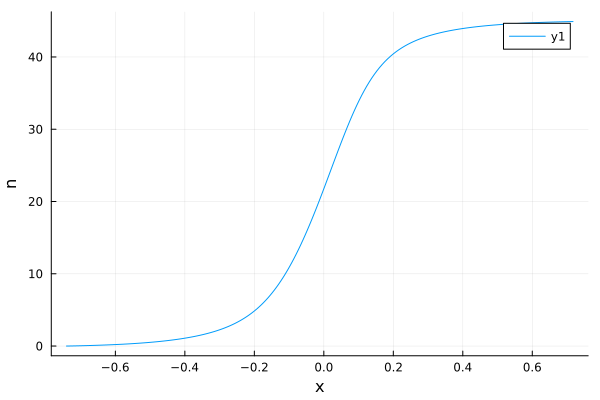

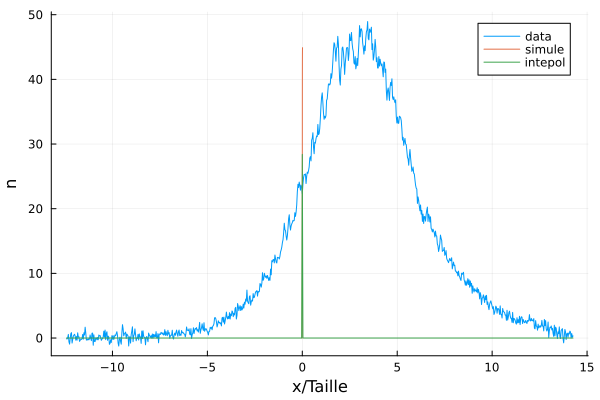

mup = 28.475493963416895
T = 1031.1411468403894
saved : ultime_test/theta_discr_ih1.npz
  0.012735 seconds (3.26 k allocations: 5.921 MiB)
size : 200
saved : ultime_test/nu_discr_ih1_28.475_1031.141.npz


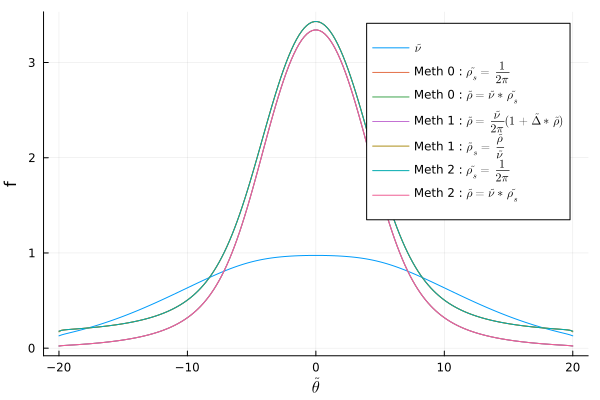

  0.001703 seconds (21 allocations: 1.840 MiB)
saved : ultime_test/rho_s_discr_ih1_28.475_1031.141.npz
  0.000013 seconds (3 allocations: 1.828 KiB)
saved : ultime_test/rho_discr_ih1_28.475_1031.141.npz
  0.566046 seconds (15.38 M allocations: 374.008 MiB, 9.11% gc time)
saved : ultime_test/theta_edge_1.0_ih1_28.475_1031.141.npz
  0.000006 seconds (111 allocations: 5.266 KiB)
saved : ultime_test/nu_theta_edge_1.0_discr_ih1_28.475_1031.141.npz
veff (1.520) = 0.000
veff (0.503) = -0.842
veff (0.704) = -0.676
veff (0.905) = -0.510
veff (1.106) = -0.344
veff (1.307) = -0.177
veff (1.508) = -0.011
veff (1.709) = 0.156
veff (1.910) = 0.324
veff (2.111) = 0.492
veff (2.312) = 0.661
veff (2.513) = 0.830


LoadError: InterruptException:

In [28]:
Taille = 54

function model_prel_mu(T,mu)
    #println(@sprintf "T = %.3f ,mu = %.3f " T mu)
    mup = mu * kB
    beta = [-mup / (kB * T) 0 mass /(kB * T)]
    nu_discr = yangyang(gbar, beta, theta_discr)
    densite = mass/hbar* charge_density(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]) )
    #println(densite)
    return densite
end

function model_mu(T,mu)
    
    OutDensite = 0*ones(size(T)[1])
    for i in 1:size(T)[1]
        #println(@sprintf "i =, T = %.3f ,mu = %.3f " i T[i] mu[i])
        OutDensite[i] = model_prel_mu(T[i],mu[i])
        #println("OutDensite = " ,OutDensite )
    end
    
                                                                          
    #p = plot(xlabel="mu", ylabel="densite", legend=:topright)
    #plot!(p, mu, OutDensite ,mode="markers",
    #marker=attr(size=12, line=attr(width=2, color="DarkSlateGrey")))
    #display(p)
    
    #println(OutDensite)
    return OutDensite
    
end

T = LinRange(600, 1000 , 5)

#Densite = 51*ones(size(T)[1])


#p0 = 50*ones(size(T)[1])


#fit = curve_fit(model, T , Densite , p0 )

function trier_x_et_y(x::Vector{T}, y::Vector{T}) where T
    # Obtenir les indices qui trient x en ordre croissant
    indices_tries = sortperm(x)
    
    # Trier x en ordre croissant
    x_tries = x[indices_tries]
    
    # Réorganiser y en conséquence
    y_tries = y[indices_tries]
    
    return x_tries, y_tries
end
;

fit_deformation = 1 == 1 
fit_expension = 0 == 1
if fit_deformation
    x_data = DONNEES[2][1]./Taille 
    y_data = DONNEES[2][2]
elseif fit_expension 
    x_data = last(DONNEES)[1]./Taille .-6/Taille
    y_data = last(DONNEES)[2]
end

new_date = "ultime_test"
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

function model_fit_inhomo_un(x, p)
    T = p[1]
    mup = coef(curve_fit(model_mu, T*ones(1) , 51*ones(1) , 50*ones(1) ))[1]*kB   
    n_p = "None"
    println("mup = ", mup/kB)
    println("T = ", T)  
    Taille = 54 #mu m 
    theta_discr = LinRange(-theta_max, theta_max, npts) 
    x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup, T, Taille, gbar)    
    
    #x_simul,y_simul = Float64.(x) , Float64.(y_data)

    x_simul, y_simul = trier_x_et_y(x_simul[:,1], y_simul[:,1])
    
    function density_fun(x)
        L = size(x)[1]
        y = ones(L)
        fun = LinearInterpolation(x_simul, y_simul)
        for i in 1:L
            if minimum(x_simul) < x[i] < maximum(x_simul) 
                y[i] = fun(x[i])
            else 
                y[i] = 0
            end
        end 
        return y
    end
    #density_fun = LinearInterpolation(x_simul, y_simul) 
    p = plot(xlabel="x/Taille", ylabel="n", legend=:topright)

    densi = density_fun(x)

    plot!(p, x,  y_data, label = "data")
    plot!(p, x_simul, y_simul , label = "simule")
    plot!(p, x, densi , label = "intepol")
    display(p)
    return densi
end 
    
using LsqFit


x_data, y_data = trier_x_et_y(x_data[:,1], y_data[:,1])



# Tracer les données
scatter(x_data, y_data, label="Données", xlabel="x", ylabel="y", legend=:topleft)                                                                        
p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data )
display(p)
                                                                        
println("size x dat :"  , size(x_data))
p0 = 730.613*ones(1) 
println( "size(p0) : " , size(p0))
# Bornes des paramètres
lower_bounds = 0.5 .* p0.*ones(size(p0)[1])
upper_bounds = 1.5 .* p0.*ones(size(p0)[1])
# Afficher les bornes
println("lower_bounds = ", lower_bounds , size(lower_bounds))
println("upper_bounds = ", upper_bounds, size(upper_bounds))
# Effectuer l'ajustement avec bornes
println("3")
println("size x_data : " , size(x_data))
println("size y_data : " , size(y_data))    
fit = curve_fit(model_fit_inhomo_un, x_data, y_data , p0 )    

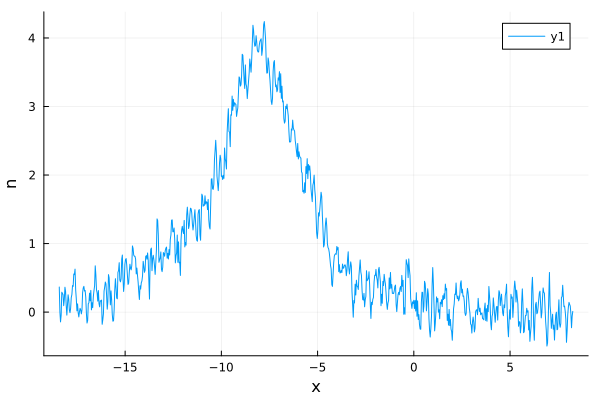

size x dat :(815,)
size(p0) : (3,)
lower_bounds = [27.5, 455.0, 29.5](3,)
upper_bounds = [82.5, 1365.0, 88.5](3,)
3
size x_data : (815,)
size y_data : (815,)
mu = 55.0
T = 910.0
Taille = 54
saved : ultime3parametre/theta_discr_ih1.npz
  0.021408 seconds (4.32 k allocations: 7.742 MiB)
size : 200
saved : ultime3parametre/nu_discr_ih1_55.000_910.000.npz


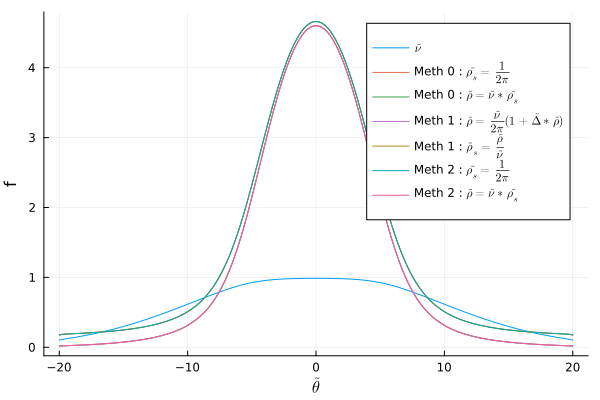

  0.002800 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_discr_ih1_55.000_910.000.npz
  0.000019 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_discr_ih1_55.000_910.000.npz
  1.089081 seconds (15.38 M allocations: 374.010 MiB, 12.52% gc time)
saved : ultime3parametre/theta_edge_1.0_ih1_55.000_910.000.npz
  0.000013 seconds (112 allocations: 5.281 KiB)
saved : ultime3parametre/nu_theta_edge_1.0_discr_ih1_55.000_910.000.npz
veff (1.780) = -0.000
veff (0.704) = -0.845
veff (0.905) = -0.688
veff (1.106) = -0.530
veff (1.307) = -0.372
veff (1.508) = -0.214
veff (1.709) = -0.056
veff (1.910) = 0.102
veff (2.111) = 0.260
veff (2.312) = 0.419
veff (2.513) = 0.578
veff (2.714) = 0.738
veff (2.915) = 0.899
theta_star = 1.780 
  0.002514 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_theta_edge_1.0_discr_ih1_55.000_910.000.npz
  0.000017 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_theta_edge_1.0_discr_ih1_55.000_910.000

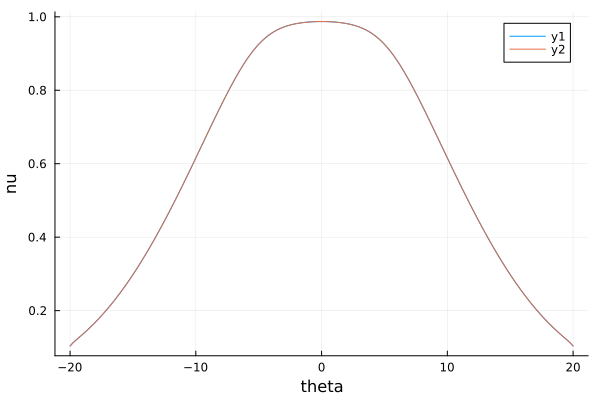

t = 0.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_0.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_0.000.npz


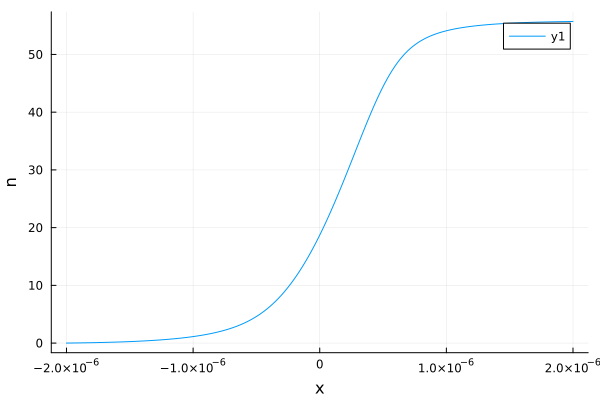

t = 1.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_1.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_1.000.npz
t = 2.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_2.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_2.000.npz


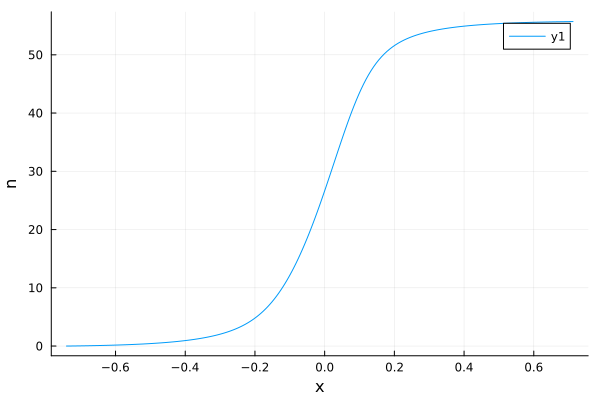

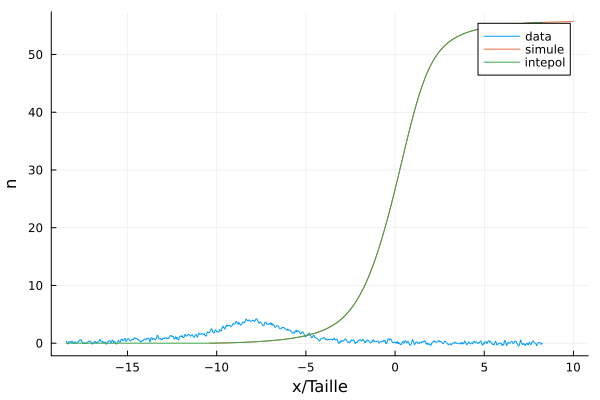

mu = 55.0
T = 910.0
Taille = 54
saved : ultime3parametre/theta_discr_ih1.npz
  0.020271 seconds (4.32 k allocations: 7.742 MiB)
size : 200
saved : ultime3parametre/nu_discr_ih1_55.000_910.000.npz


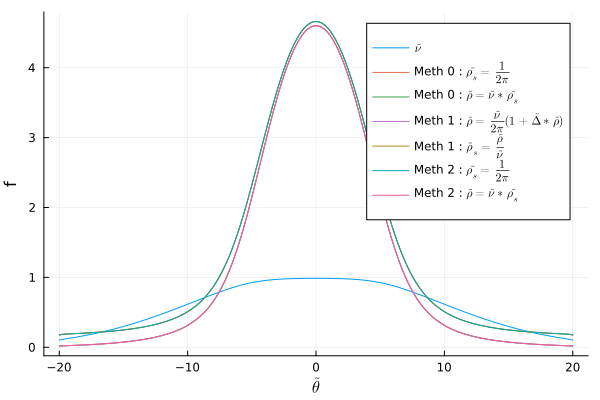

  0.002926 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_discr_ih1_55.000_910.000.npz
  0.000026 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_discr_ih1_55.000_910.000.npz
  1.094082 seconds (15.38 M allocations: 374.010 MiB, 11.64% gc time)
saved : ultime3parametre/theta_edge_1.0_ih1_55.000_910.000.npz
  0.000013 seconds (112 allocations: 5.281 KiB)
saved : ultime3parametre/nu_theta_edge_1.0_discr_ih1_55.000_910.000.npz
veff (1.780) = -0.000
veff (0.704) = -0.845
veff (0.905) = -0.688
veff (1.106) = -0.530
veff (1.307) = -0.372
veff (1.508) = -0.214
veff (1.709) = -0.056
veff (1.910) = 0.102
veff (2.111) = 0.260
veff (2.312) = 0.419
veff (2.513) = 0.578
veff (2.714) = 0.738
veff (2.915) = 0.899
theta_star = 1.780 
  0.002472 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_theta_edge_1.0_discr_ih1_55.000_910.000.npz
  0.000023 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_theta_edge_1.0_discr_ih1_55.000_910.000

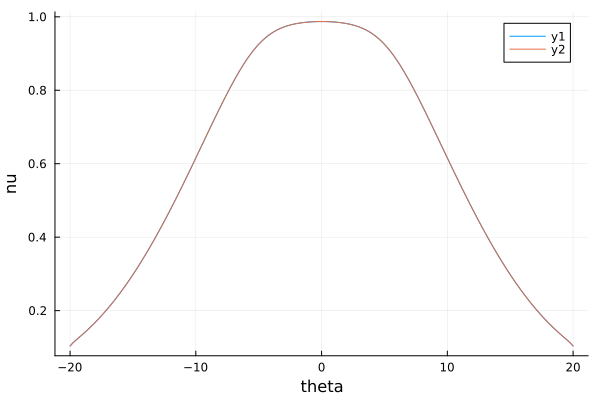

t = 0.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_0.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_0.000.npz


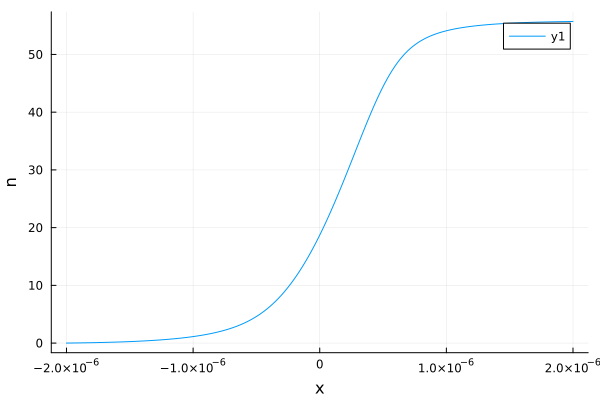

t = 1.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_1.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_1.000.npz
t = 2.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_2.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_2.000.npz


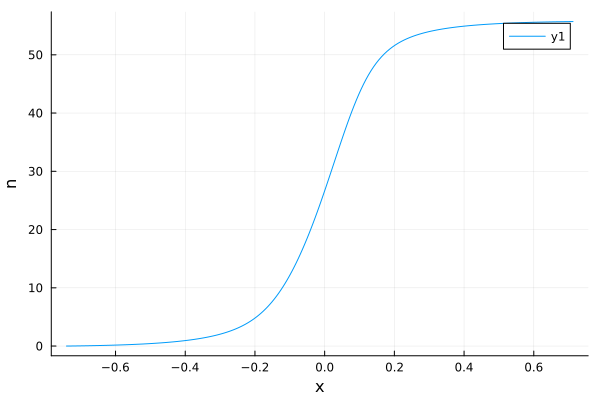

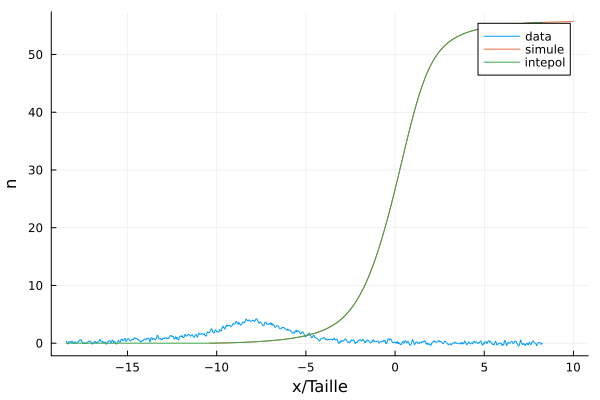

mu = 55.00033304999488
T = 910.0
Taille = 54
saved : ultime3parametre/theta_discr_ih1.npz
  0.020680 seconds (4.32 k allocations: 7.742 MiB)
size : 200
saved : ultime3parametre/nu_discr_ih1_55.000_910.000.npz


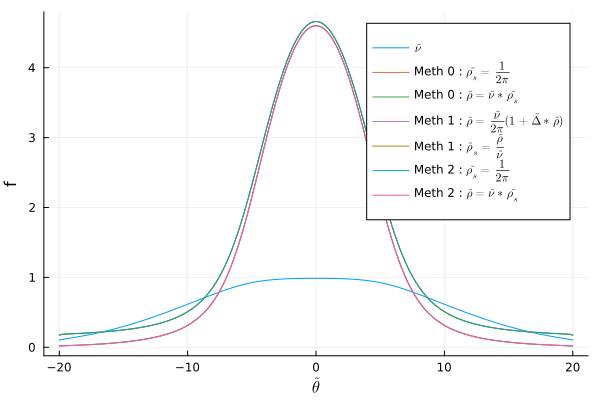

  0.011412 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_discr_ih1_55.000_910.000.npz
  0.000019 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_discr_ih1_55.000_910.000.npz
  1.005494 seconds (15.38 M allocations: 374.010 MiB, 6.24% gc time)
saved : ultime3parametre/theta_edge_1.0_ih1_55.000_910.000.npz
  0.000015 seconds (112 allocations: 5.281 KiB)
saved : ultime3parametre/nu_theta_edge_1.0_discr_ih1_55.000_910.000.npz
veff (1.780) = -0.000
veff (0.704) = -0.845
veff (0.905) = -0.688
veff (1.106) = -0.530
veff (1.307) = -0.372
veff (1.508) = -0.214
veff (1.709) = -0.056
veff (1.910) = 0.102
veff (2.111) = 0.260
veff (2.312) = 0.419
veff (2.513) = 0.578
veff (2.714) = 0.738
veff (2.915) = 0.899
theta_star = 1.780 
  0.009014 seconds (21 allocations: 1.840 MiB, 71.42% gc time)
saved : ultime3parametre/rho_s_theta_edge_1.0_discr_ih1_55.000_910.000.npz
  0.000016 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_theta_edge_1.0_discr_ih1

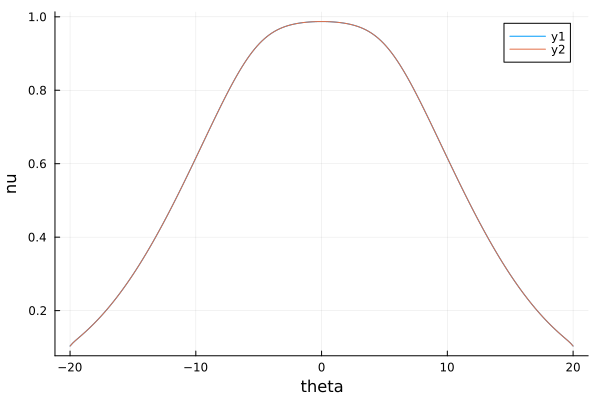

t = 0.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_0.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_0.000.npz


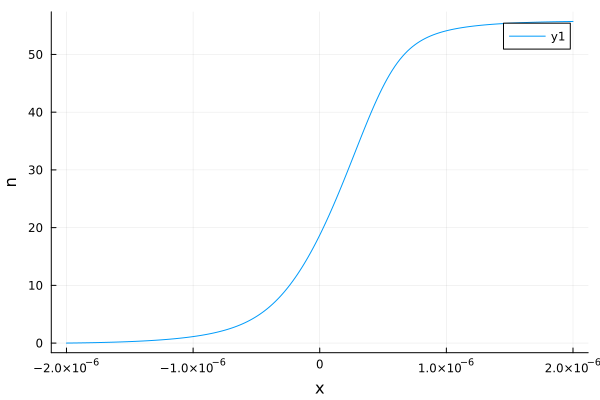

t = 1.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_1.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_1.000.npz
t = 2.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_2.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_2.000.npz


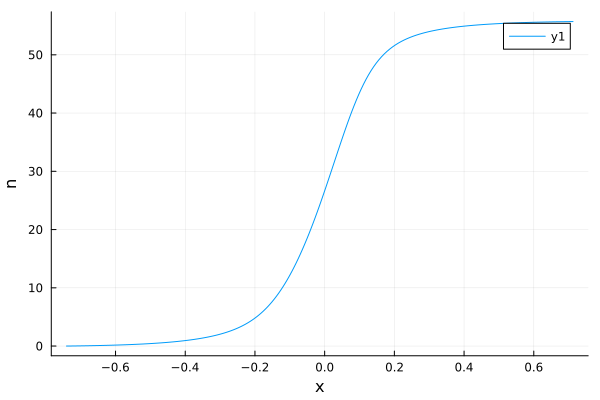

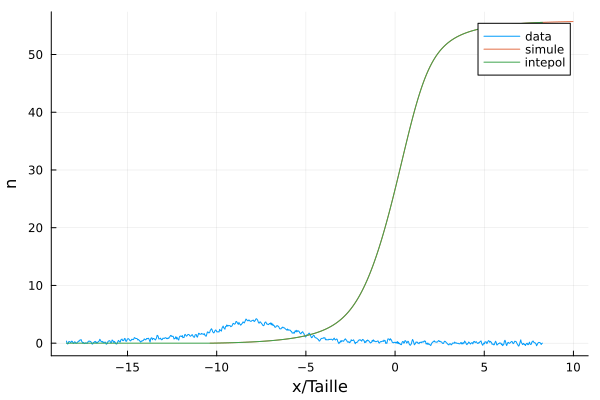

mu = 54.99966695000512
T = 910.0
Taille = 54
saved : ultime3parametre/theta_discr_ih1.npz
  0.022471 seconds (4.32 k allocations: 7.742 MiB)
size : 200
saved : ultime3parametre/nu_discr_ih1_55.000_910.000.npz


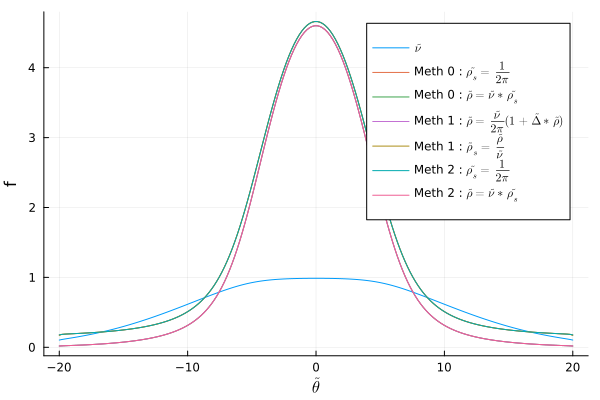

  0.002208 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_discr_ih1_55.000_910.000.npz
  0.000020 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_discr_ih1_55.000_910.000.npz
  0.957492 seconds (15.38 M allocations: 374.010 MiB, 7.67% gc time)
saved : ultime3parametre/theta_edge_1.0_ih1_55.000_910.000.npz
  0.000010 seconds (112 allocations: 5.281 KiB)
saved : ultime3parametre/nu_theta_edge_1.0_discr_ih1_55.000_910.000.npz
veff (1.780) = 0.000
veff (0.704) = -0.845
veff (0.905) = -0.688
veff (1.106) = -0.530
veff (1.307) = -0.372
veff (1.508) = -0.214
veff (1.709) = -0.056
veff (1.910) = 0.102
veff (2.111) = 0.260
veff (2.312) = 0.419
veff (2.513) = 0.578
veff (2.714) = 0.738
veff (2.915) = 0.899
theta_star = 1.780 
  0.001386 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_theta_edge_1.0_discr_ih1_55.000_910.000.npz
  0.000010 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_theta_edge_1.0_discr_ih1_55.000_910.000.n

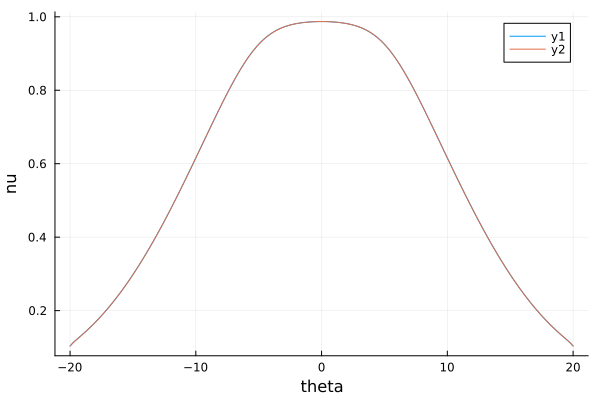

t = 0.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_0.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_0.000.npz


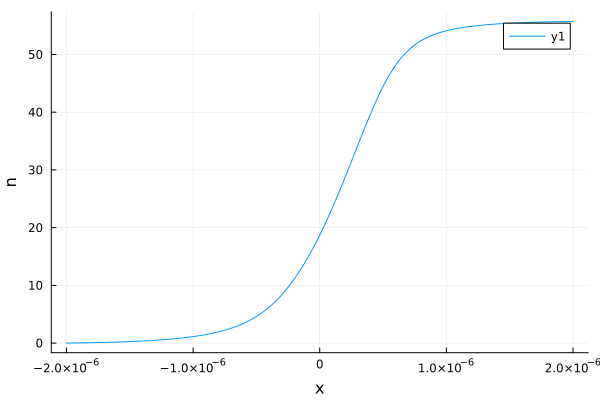

t = 1.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_1.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_1.000.npz
t = 2.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_2.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_2.000.npz


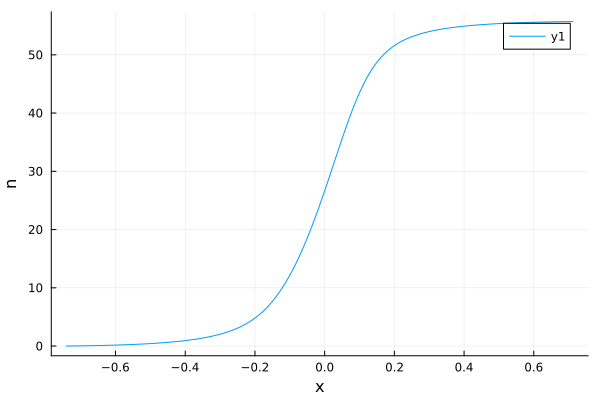

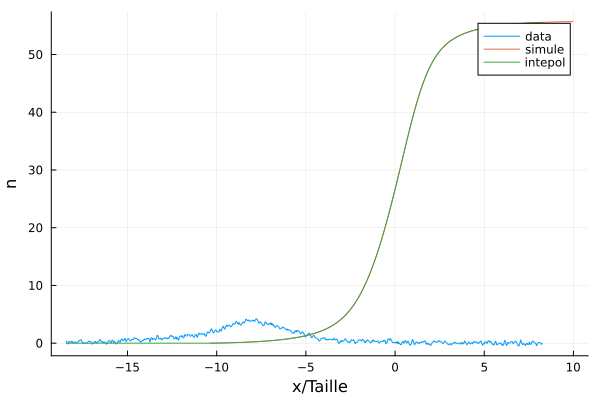

mu = 55.0
T = 910.0055104635517
Taille = 54
saved : ultime3parametre/theta_discr_ih1.npz
  0.012910 seconds (4.32 k allocations: 7.742 MiB)
size : 200
saved : ultime3parametre/nu_discr_ih1_55.000_910.006.npz


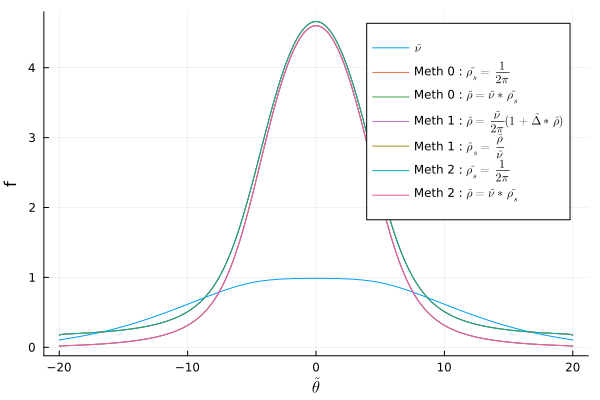

  0.002458 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_discr_ih1_55.000_910.006.npz
  0.000019 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_discr_ih1_55.000_910.006.npz
  1.006716 seconds (15.38 M allocations: 374.010 MiB, 6.30% gc time)
saved : ultime3parametre/theta_edge_1.0_ih1_55.000_910.006.npz
  0.000012 seconds (112 allocations: 5.281 KiB)
saved : ultime3parametre/nu_theta_edge_1.0_discr_ih1_55.000_910.006.npz
veff (1.780) = -0.000
veff (0.704) = -0.845
veff (0.905) = -0.688
veff (1.106) = -0.530
veff (1.307) = -0.372
veff (1.508) = -0.214
veff (1.709) = -0.056
veff (1.910) = 0.102
veff (2.111) = 0.260
veff (2.312) = 0.419
veff (2.513) = 0.578
veff (2.714) = 0.738
veff (2.915) = 0.899
theta_star = 1.780 
  0.008841 seconds (21 allocations: 1.840 MiB, 71.46% gc time)
saved : ultime3parametre/rho_s_theta_edge_1.0_discr_ih1_55.000_910.006.npz
  0.000015 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_theta_edge_1.0_discr_ih1

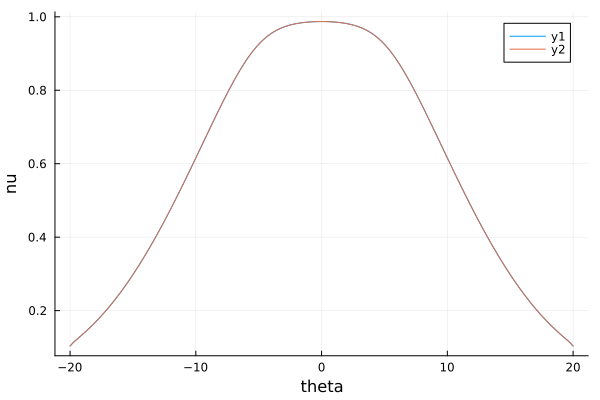

t = 0.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.006_54.000_0.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.006_54.000_0.000.npz


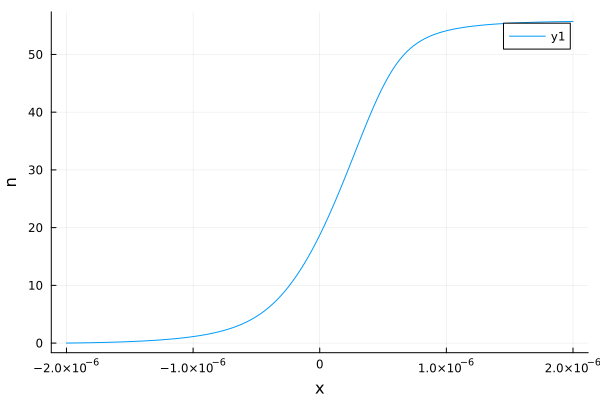

t = 1.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.006_54.000_1.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.006_54.000_1.000.npz
t = 2.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.006_54.000_2.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.006_54.000_2.000.npz


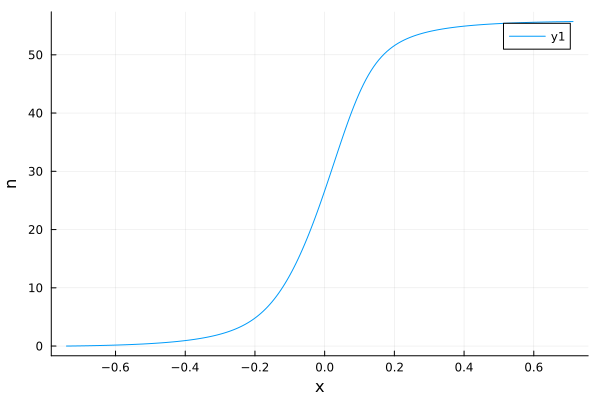

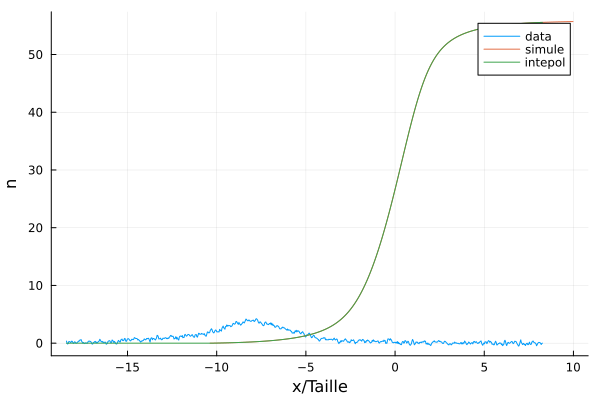

mu = 55.0
T = 909.9944895364483
Taille = 54
saved : ultime3parametre/theta_discr_ih1.npz
  0.050960 seconds (4.32 k allocations: 7.742 MiB)
size : 200
saved : ultime3parametre/nu_discr_ih1_55.000_909.994.npz


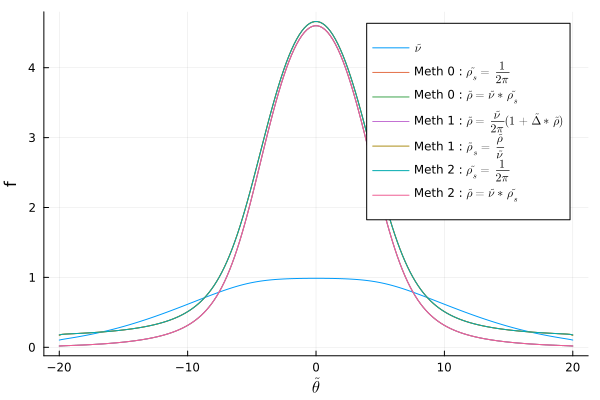

  0.002862 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_discr_ih1_55.000_909.994.npz
  0.000026 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_discr_ih1_55.000_909.994.npz
  0.628150 seconds (15.38 M allocations: 374.010 MiB, 7.77% gc time)
saved : ultime3parametre/theta_edge_1.0_ih1_55.000_909.994.npz
  0.000005 seconds (112 allocations: 5.281 KiB)
saved : ultime3parametre/nu_theta_edge_1.0_discr_ih1_55.000_909.994.npz
veff (1.780) = 0.000
veff (0.704) = -0.845
veff (0.905) = -0.688
veff (1.106) = -0.530
veff (1.307) = -0.372
veff (1.508) = -0.214
veff (1.709) = -0.056
veff (1.910) = 0.102
veff (2.111) = 0.260
veff (2.312) = 0.419
veff (2.513) = 0.578
veff (2.714) = 0.738
veff (2.915) = 0.899
theta_star = 1.780 
  0.001970 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_theta_edge_1.0_discr_ih1_55.000_909.994.npz
  0.000012 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_theta_edge_1.0_discr_ih1_55.000_909.994.n

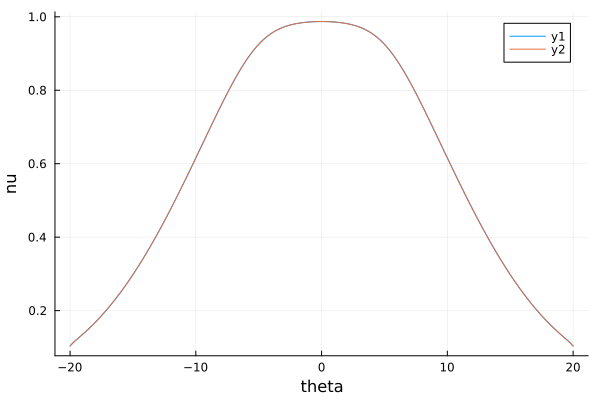

t = 0.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_909.994_54.000_0.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_909.994_54.000_0.000.npz


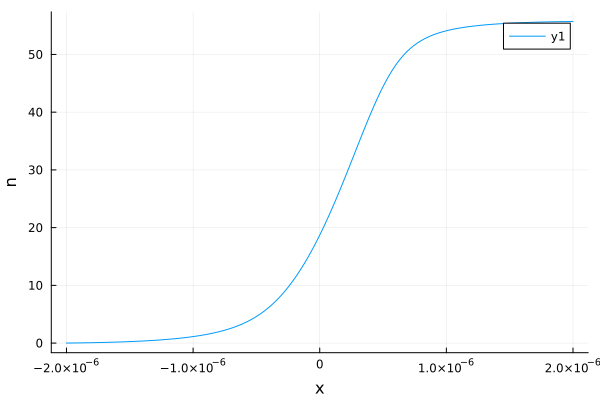

t = 1.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_909.994_54.000_1.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_909.994_54.000_1.000.npz
t = 2.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_909.994_54.000_2.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_909.994_54.000_2.000.npz


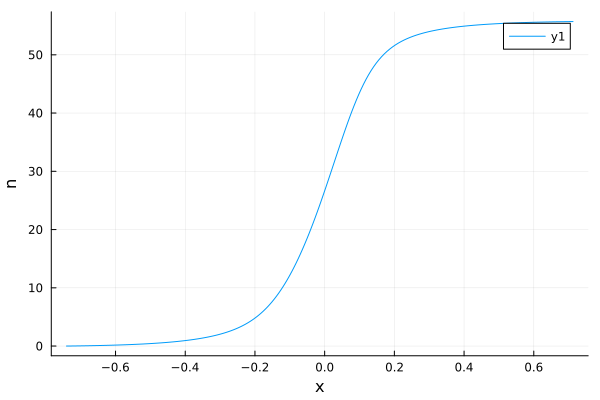

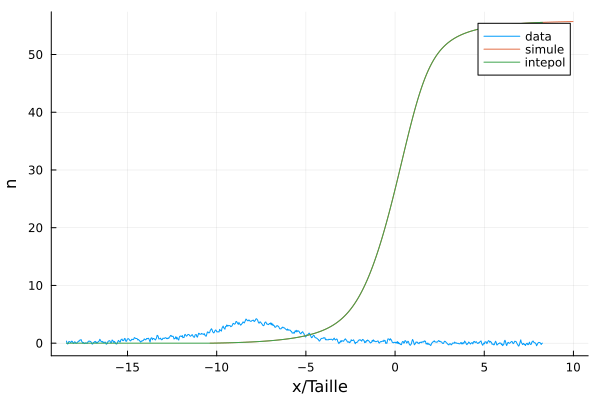

mu = 55.0
T = 910.0
Taille = 54
saved : ultime3parametre/theta_discr_ih1.npz
  0.016057 seconds (4.32 k allocations: 7.742 MiB)
size : 200
saved : ultime3parametre/nu_discr_ih1_55.000_910.000.npz


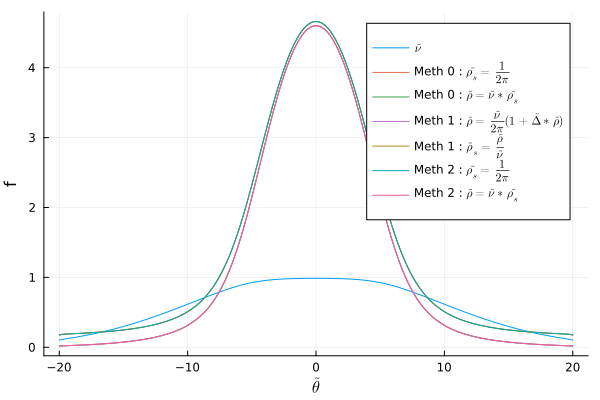

  0.006056 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_discr_ih1_55.000_910.000.npz
  0.000035 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_discr_ih1_55.000_910.000.npz
  1.045422 seconds (15.38 M allocations: 374.010 MiB, 6.15% gc time)
saved : ultime3parametre/theta_edge_1.0_ih1_55.000_910.000.npz
  0.000011 seconds (112 allocations: 5.281 KiB)
saved : ultime3parametre/nu_theta_edge_1.0_discr_ih1_55.000_910.000.npz
veff (1.780) = -0.000
veff (0.704) = -0.845
veff (0.905) = -0.688
veff (1.106) = -0.530
veff (1.307) = -0.372
veff (1.508) = -0.214
veff (1.709) = -0.056
veff (1.910) = 0.102
veff (2.111) = 0.260
veff (2.312) = 0.419
veff (2.513) = 0.578
veff (2.714) = 0.738
veff (2.915) = 0.899
theta_star = 1.780 
  0.009032 seconds (21 allocations: 1.840 MiB, 71.32% gc time)
saved : ultime3parametre/rho_s_theta_edge_1.0_discr_ih1_55.000_910.000.npz
  0.000021 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_theta_edge_1.0_discr_ih1

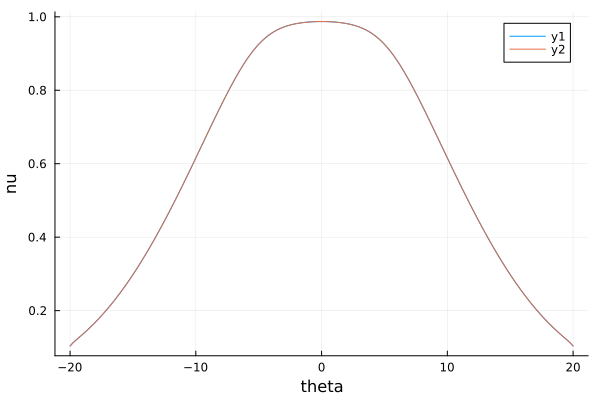

t = 0.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_0.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_0.000.npz


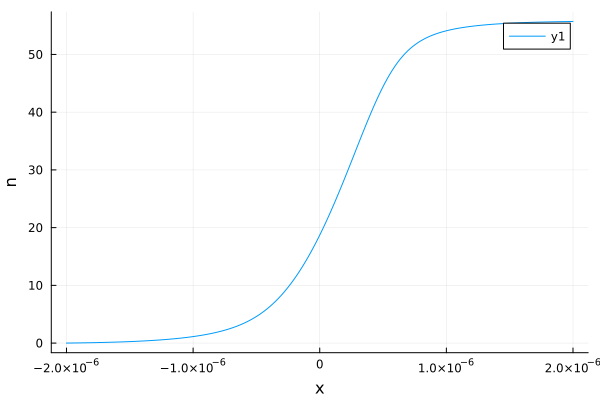

t = 1.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_1.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_1.000.npz
t = 2.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_2.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_2.000.npz


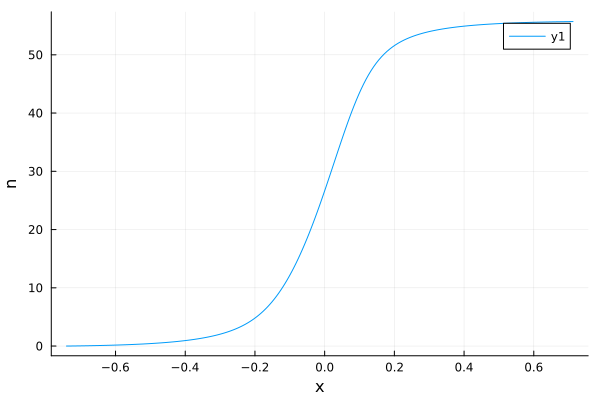

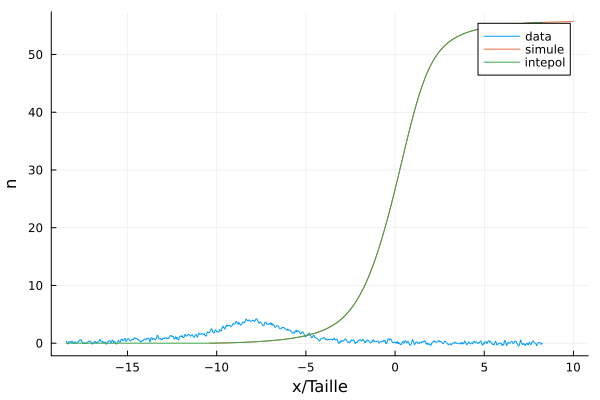

mu = 55.0
T = 910.0
Taille = 54
saved : ultime3parametre/theta_discr_ih1.npz
  0.021572 seconds (4.32 k allocations: 7.742 MiB)
size : 200
saved : ultime3parametre/nu_discr_ih1_55.000_910.000.npz


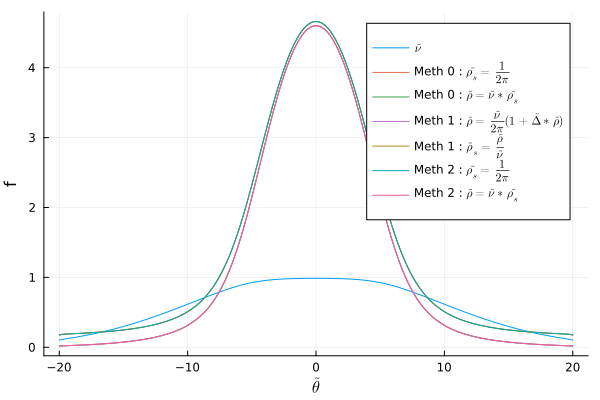

  0.004984 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_discr_ih1_55.000_910.000.npz
  0.000045 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_discr_ih1_55.000_910.000.npz
  0.896028 seconds (15.38 M allocations: 374.010 MiB, 8.10% gc time)
saved : ultime3parametre/theta_edge_1.0_ih1_55.000_910.000.npz
  0.000005 seconds (112 allocations: 5.281 KiB)
saved : ultime3parametre/nu_theta_edge_1.0_discr_ih1_55.000_910.000.npz
veff (1.780) = -0.000
veff (0.704) = -0.845
veff (0.905) = -0.688
veff (1.106) = -0.530
veff (1.307) = -0.372
veff (1.508) = -0.214
veff (1.709) = -0.056
veff (1.910) = 0.102
veff (2.111) = 0.260
veff (2.312) = 0.419
veff (2.513) = 0.578
veff (2.714) = 0.738
veff (2.915) = 0.899
theta_star = 1.780 
  0.001664 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_theta_edge_1.0_discr_ih1_55.000_910.000.npz
  0.000012 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_theta_edge_1.0_discr_ih1_55.000_910.000.

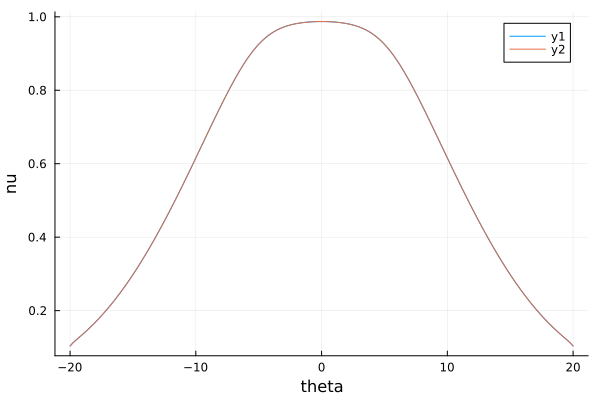

t = 0.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_0.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_0.000.npz


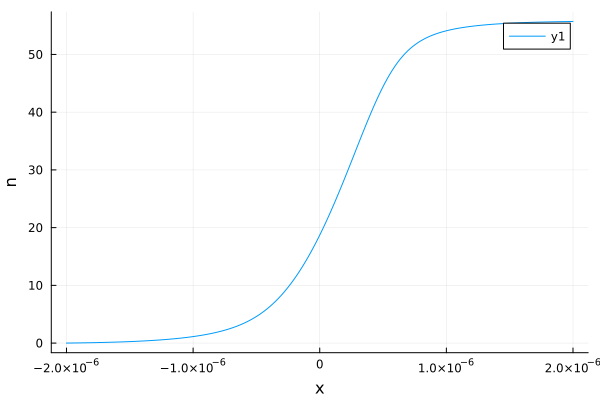

t = 1.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_1.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_1.000.npz
t = 2.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_55.000_910.000_54.000_2.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_55.000_910.000_54.000_2.000.npz


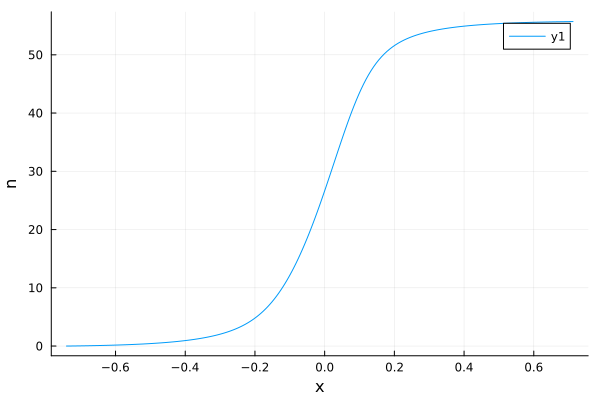

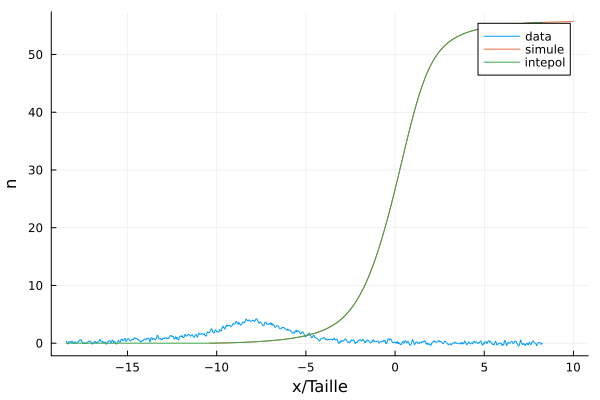

mu = 47.88257045749238
T = 689.9253914600797
Taille = 54
saved : ultime3parametre/theta_discr_ih1.npz
  0.011818 seconds (3.88 k allocations: 6.997 MiB)
size : 200
saved : ultime3parametre/nu_discr_ih1_47.883_689.925.npz


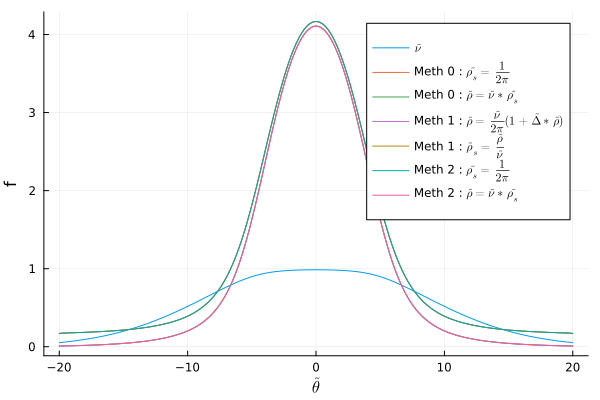

  0.008819 seconds (21 allocations: 1.840 MiB, 69.04% gc time)
saved : ultime3parametre/rho_s_discr_ih1_47.883_689.925.npz
  0.000021 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_discr_ih1_47.883_689.925.npz
  0.720807 seconds (15.38 M allocations: 374.008 MiB, 7.19% gc time)
saved : ultime3parametre/theta_edge_1.0_ih1_47.883_689.925.npz
  0.000010 seconds (111 allocations: 5.266 KiB)
saved : ultime3parametre/nu_theta_edge_1.0_discr_ih1_47.883_689.925.npz
veff (1.595) = 0.000
veff (0.503) = -0.862
veff (0.704) = -0.703
veff (0.905) = -0.545
veff (1.106) = -0.386
veff (1.307) = -0.228
veff (1.508) = -0.069
veff (1.709) = 0.090
veff (1.910) = 0.249
veff (2.111) = 0.408
veff (2.312) = 0.568
veff (2.513) = 0.729
veff (2.714) = 0.891
theta_star = 1.595 
  0.008174 seconds (21 allocations: 1.840 MiB, 71.84% gc time)
saved : ultime3parametre/rho_s_theta_edge_1.0_discr_ih1_47.883_689.925.npz
  0.000016 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_theta_edg

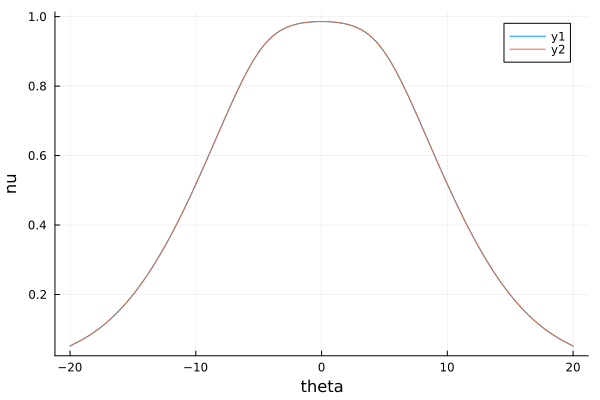

t = 0.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_47.883_689.925_54.000_0.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_47.883_689.925_54.000_0.000.npz


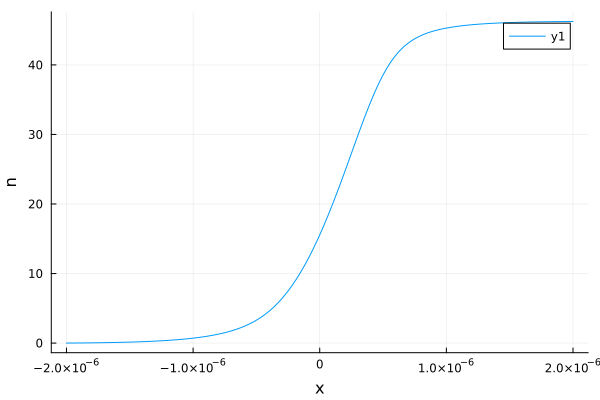

t = 1.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_47.883_689.925_54.000_1.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_47.883_689.925_54.000_1.000.npz
t = 2.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_47.883_689.925_54.000_2.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_47.883_689.925_54.000_2.000.npz


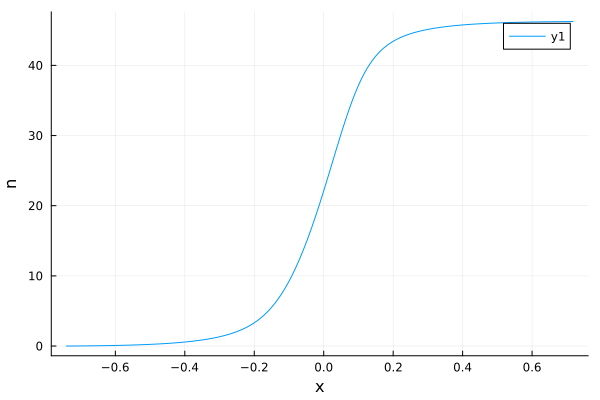

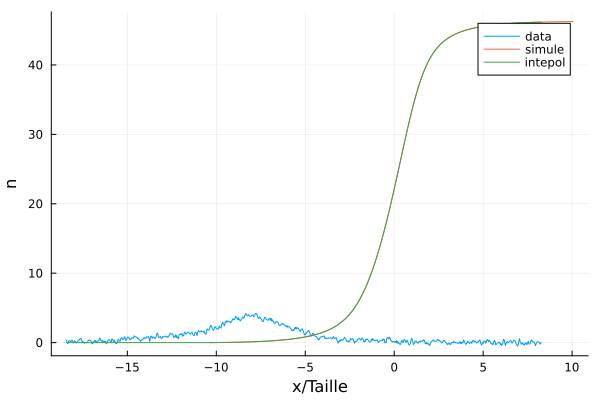

mu = 47.88257045749238
T = 689.9253914600797
Taille = 54
saved : ultime3parametre/theta_discr_ih1.npz
  0.013777 seconds (3.88 k allocations: 6.997 MiB)
size : 200
saved : ultime3parametre/nu_discr_ih1_47.883_689.925.npz


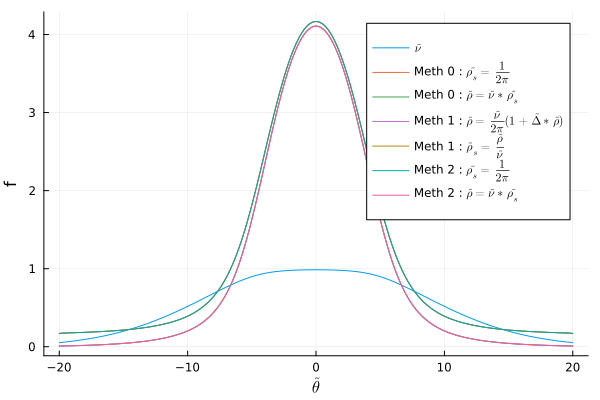

  0.001691 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_discr_ih1_47.883_689.925.npz
  0.000014 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_discr_ih1_47.883_689.925.npz
  0.724069 seconds (15.38 M allocations: 374.008 MiB, 16.97% gc time)
saved : ultime3parametre/theta_edge_1.0_ih1_47.883_689.925.npz
  0.000009 seconds (111 allocations: 5.266 KiB)
saved : ultime3parametre/nu_theta_edge_1.0_discr_ih1_47.883_689.925.npz
veff (1.595) = 0.000
veff (0.503) = -0.862
veff (0.704) = -0.703
veff (0.905) = -0.545
veff (1.106) = -0.386
veff (1.307) = -0.228
veff (1.508) = -0.069
veff (1.709) = 0.090
veff (1.910) = 0.249
veff (2.111) = 0.408
veff (2.312) = 0.568
veff (2.513) = 0.729
veff (2.714) = 0.891
theta_star = 1.595 
  0.002052 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_theta_edge_1.0_discr_ih1_47.883_689.925.npz
  0.000015 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_theta_edge_1.0_discr_ih1_47.883_689.925.

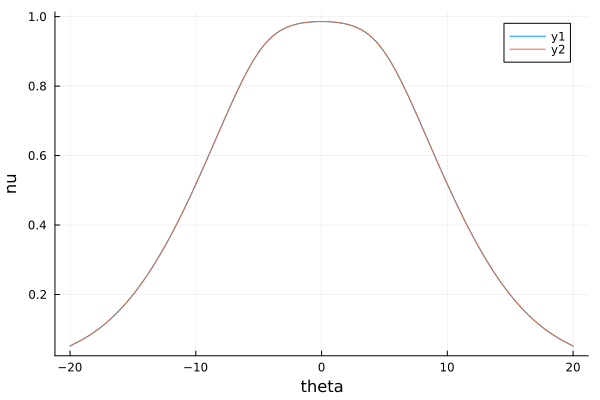

t = 0.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_47.883_689.925_54.000_0.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_47.883_689.925_54.000_0.000.npz


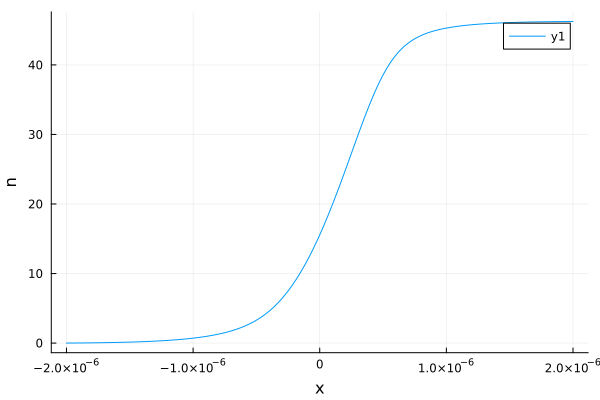

t = 1.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_47.883_689.925_54.000_1.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_47.883_689.925_54.000_1.000.npz
t = 2.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_47.883_689.925_54.000_2.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_47.883_689.925_54.000_2.000.npz


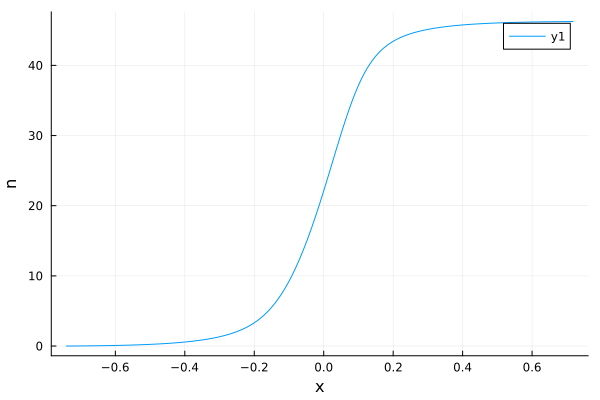

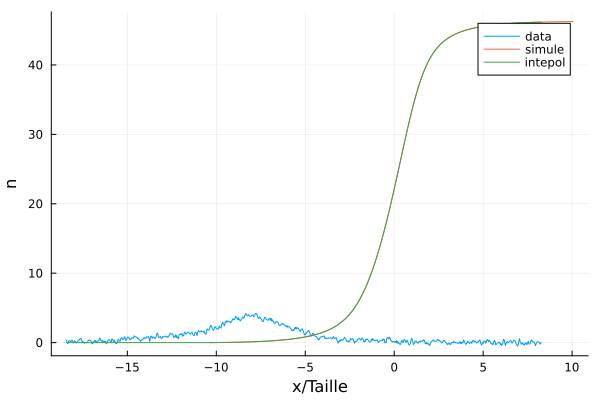

mu = 47.88286040821685
T = 689.9253914600797
Taille = 54
saved : ultime3parametre/theta_discr_ih1.npz
  0.018346 seconds (3.88 k allocations: 6.997 MiB)
size : 200
saved : ultime3parametre/nu_discr_ih1_47.883_689.925.npz


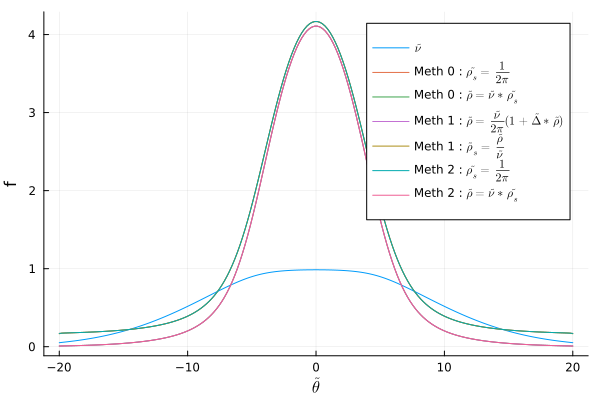

  0.006106 seconds (21 allocations: 1.840 MiB, 63.10% gc time)
saved : ultime3parametre/rho_s_discr_ih1_47.883_689.925.npz
  0.000018 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_discr_ih1_47.883_689.925.npz
  1.022031 seconds (15.38 M allocations: 374.008 MiB, 6.17% gc time)
saved : ultime3parametre/theta_edge_1.0_ih1_47.883_689.925.npz
  0.000011 seconds (111 allocations: 5.266 KiB)
saved : ultime3parametre/nu_theta_edge_1.0_discr_ih1_47.883_689.925.npz
veff (1.595) = -0.000
veff (0.503) = -0.862
veff (0.704) = -0.703
veff (0.905) = -0.545
veff (1.106) = -0.386
veff (1.307) = -0.228
veff (1.508) = -0.069
veff (1.709) = 0.090
veff (1.910) = 0.249
veff (2.111) = 0.408
veff (2.312) = 0.568
veff (2.513) = 0.729
veff (2.714) = 0.891
theta_star = 1.595 
  0.002045 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_theta_edge_1.0_discr_ih1_47.883_689.925.npz
  0.000013 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_theta_edge_1.0_discr_ih1

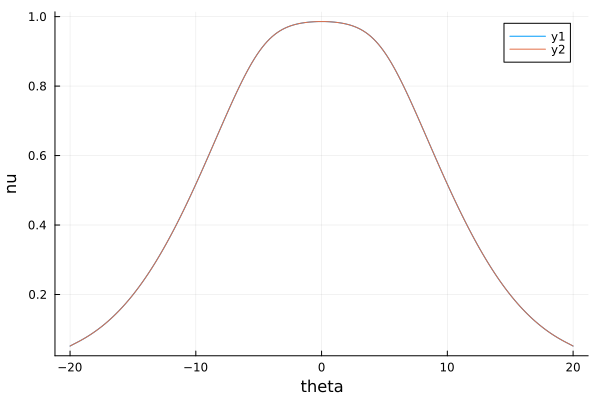

t = 0.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_47.883_689.925_54.000_0.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_47.883_689.925_54.000_0.000.npz


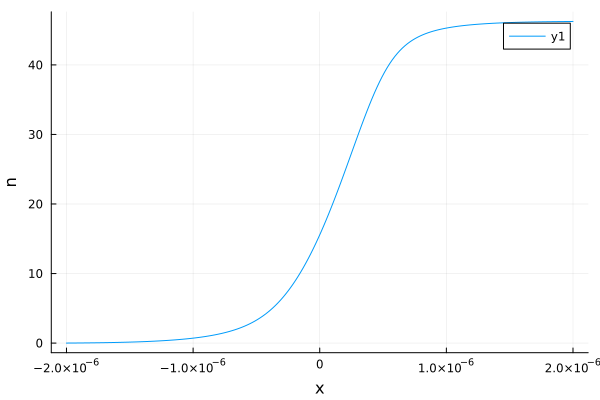

t = 1.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_47.883_689.925_54.000_1.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_47.883_689.925_54.000_1.000.npz
t = 2.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_47.883_689.925_54.000_2.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_47.883_689.925_54.000_2.000.npz


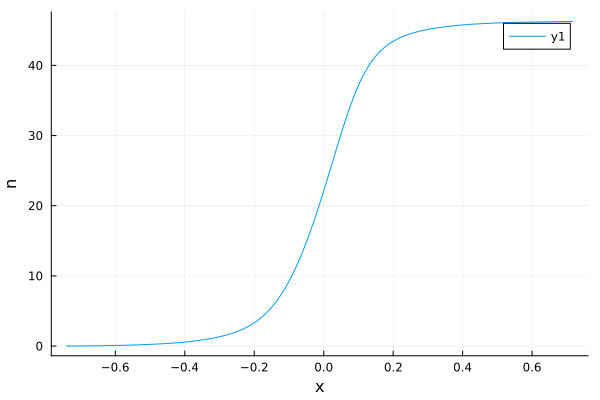

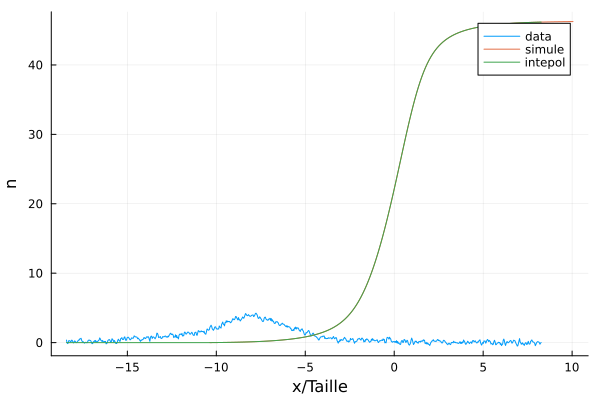

mu = 47.882280506767906
T = 689.9253914600797
Taille = 54
saved : ultime3parametre/theta_discr_ih1.npz
  0.014556 seconds (3.88 k allocations: 6.997 MiB)
size : 200
saved : ultime3parametre/nu_discr_ih1_47.882_689.925.npz


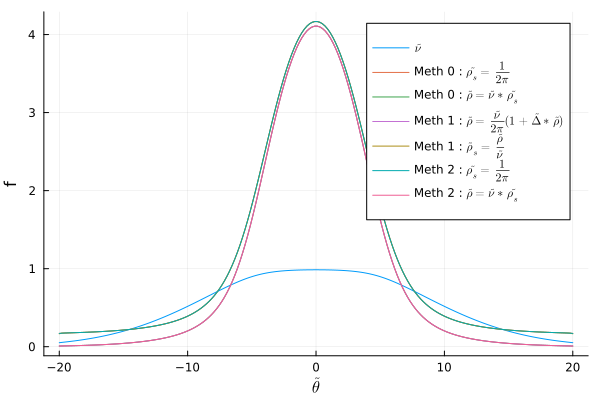

  0.002048 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_discr_ih1_47.882_689.925.npz
  0.000016 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_discr_ih1_47.882_689.925.npz
  0.714735 seconds (15.38 M allocations: 374.008 MiB, 7.38% gc time)
saved : ultime3parametre/theta_edge_1.0_ih1_47.882_689.925.npz
  0.000005 seconds (111 allocations: 5.266 KiB)
saved : ultime3parametre/nu_theta_edge_1.0_discr_ih1_47.882_689.925.npz
veff (1.595) = 0.000
veff (0.503) = -0.862
veff (0.704) = -0.703
veff (0.905) = -0.545
veff (1.106) = -0.386
veff (1.307) = -0.228
veff (1.508) = -0.069
veff (1.709) = 0.090
veff (1.910) = 0.249
veff (2.111) = 0.408
veff (2.312) = 0.568
veff (2.513) = 0.729
veff (2.714) = 0.891
theta_star = 1.595 
  0.001721 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_theta_edge_1.0_discr_ih1_47.882_689.925.npz
  0.000010 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_theta_edge_1.0_discr_ih1_47.882_689.925.n

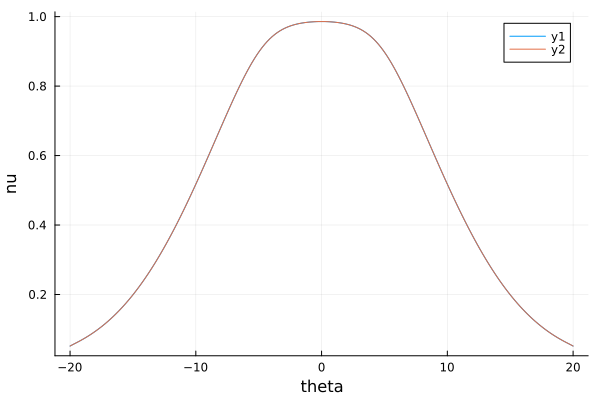

t = 0.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_47.882_689.925_54.000_0.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_47.882_689.925_54.000_0.000.npz


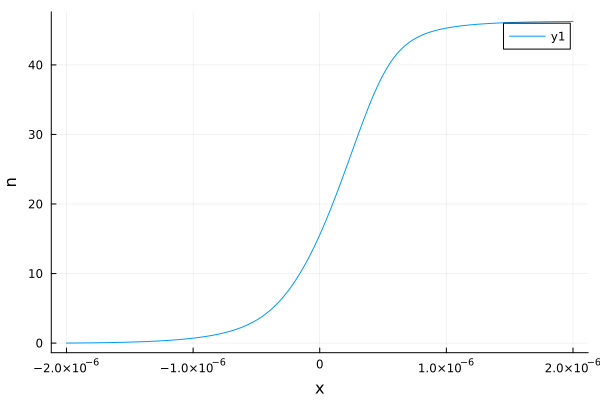

t = 1.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_47.882_689.925_54.000_1.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_47.882_689.925_54.000_1.000.npz
t = 2.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_47.882_689.925_54.000_2.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_47.882_689.925_54.000_2.000.npz


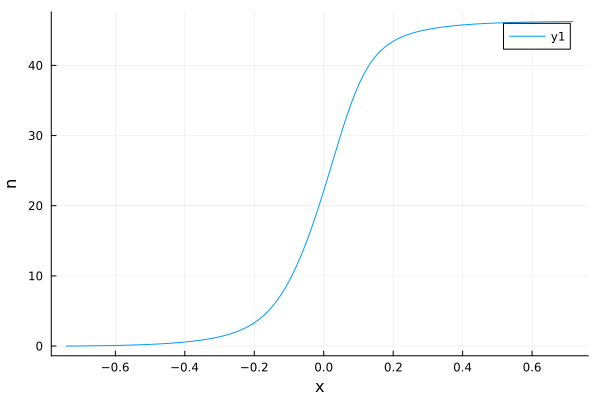

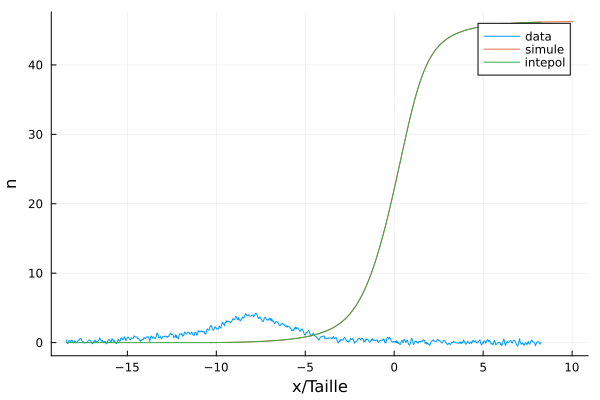

mu = 47.88257045749238
T = 689.9295692718632
Taille = 54
saved : ultime3parametre/theta_discr_ih1.npz
  0.018325 seconds (3.88 k allocations: 6.997 MiB)
size : 200
saved : ultime3parametre/nu_discr_ih1_47.883_689.930.npz


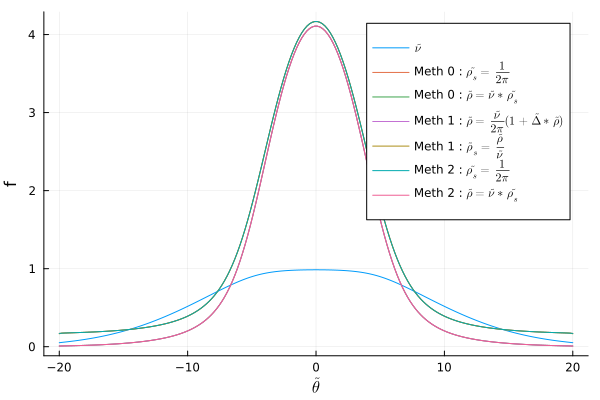

  0.001896 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_discr_ih1_47.883_689.930.npz
  0.000018 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_discr_ih1_47.883_689.930.npz
  0.961829 seconds (15.38 M allocations: 374.008 MiB, 6.76% gc time)
saved : ultime3parametre/theta_edge_1.0_ih1_47.883_689.930.npz
  0.000013 seconds (111 allocations: 5.266 KiB)
saved : ultime3parametre/nu_theta_edge_1.0_discr_ih1_47.883_689.930.npz
veff (1.595) = 0.000
veff (0.503) = -0.862
veff (0.704) = -0.703
veff (0.905) = -0.545
veff (1.106) = -0.386
veff (1.307) = -0.228
veff (1.508) = -0.069
veff (1.709) = 0.090
veff (1.910) = 0.249
veff (2.111) = 0.408
veff (2.312) = 0.568
veff (2.513) = 0.729
veff (2.714) = 0.891
theta_star = 1.595 
  0.002072 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_theta_edge_1.0_discr_ih1_47.883_689.930.npz
  0.000015 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_theta_edge_1.0_discr_ih1_47.883_689.930.n

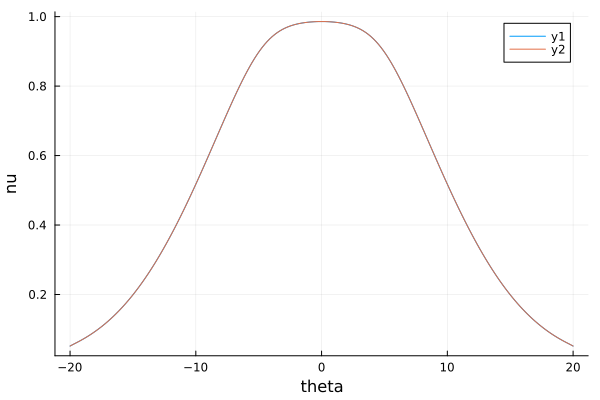

t = 0.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_47.883_689.930_54.000_0.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_47.883_689.930_54.000_0.000.npz


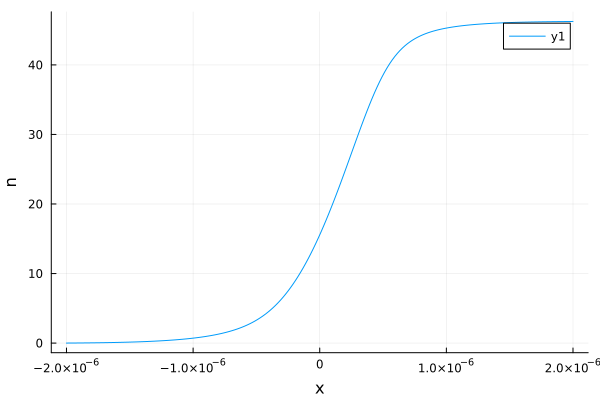

t = 1.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_47.883_689.930_54.000_1.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_47.883_689.930_54.000_1.000.npz
t = 2.000 saved
saved : ultime3parametre/density_expansion_nu_theta_edge_1.0_ih1_47.883_689.930_54.000_2.000.npz
saved : ultime3parametre/bord_theta_edge_1.0_ih1_47.883_689.930_54.000_2.000.npz


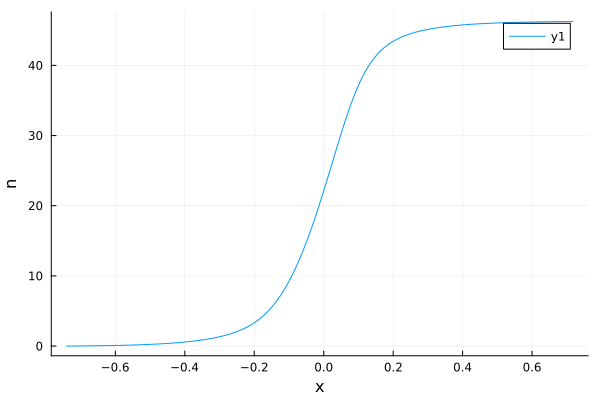

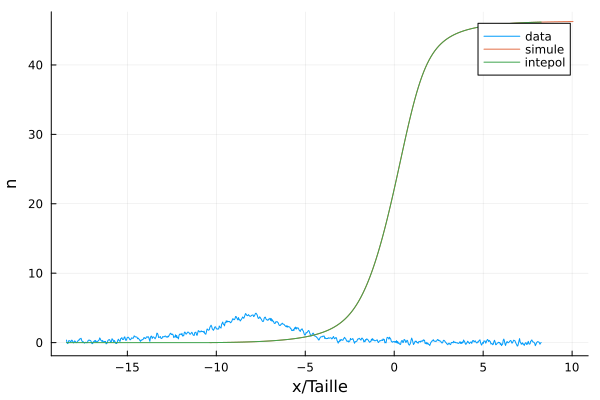

mu = 47.88257045749238
T = 689.9212136482962
Taille = 54
saved : ultime3parametre/theta_discr_ih1.npz
  0.018410 seconds (3.88 k allocations: 6.997 MiB)
size : 200
saved : ultime3parametre/nu_discr_ih1_47.883_689.921.npz


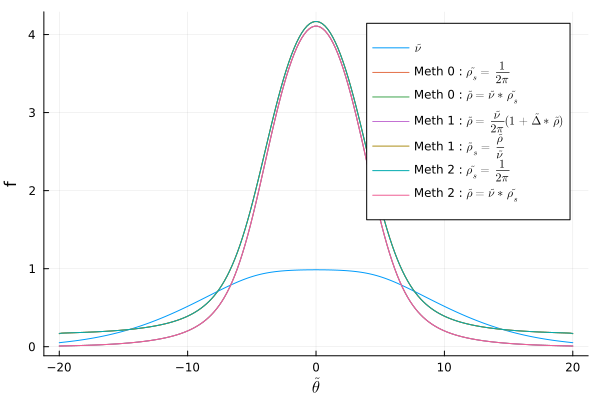

  0.002268 seconds (21 allocations: 1.840 MiB)
saved : ultime3parametre/rho_s_discr_ih1_47.883_689.921.npz
  0.000022 seconds (3 allocations: 1.828 KiB)
saved : ultime3parametre/rho_discr_ih1_47.883_689.921.npz
  1.044800 seconds (15.38 M allocations: 374.008 MiB, 7.40% gc time)
saved : ultime3parametre/theta_edge_1.0_ih1_47.883_689.921.npz
  0.000009 seconds (111 allocations: 5.266 KiB)
saved : ultime3parametre/nu_theta_edge_1.0_discr_ih1_47.883_689.921.npz
veff (1.595) = -0.000


LoadError: InterruptException:

In [22]:
Taille = 54 #mu m 


x_data = last(DONNEES)[1]./Taille .-6
y_data = last(DONNEES)[2]

new_date = "ultime3parametre"
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end


function model_fit_inhomo_trois(x, p)
    mup , T , Taille = p[1]*kB , p[2] , p[3]  
    n_p = "None"
    Taille = 54 #mu m 
    println("mu = ", mup/kB)
    println("T = ", T)  
    println("Taille = ", Taille)
    theta_discr = LinRange(-theta_max, theta_max, npts) 
    x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup, T, Taille, gbar)    
    
    #x_simul,y_simul = Float64.(x) , Float64.(y_data)

    x_simul, y_simul = trier_x_et_y(x_simul[:,1], y_simul[:,1])
    
    function density_fun(x)
        L = size(x)[1]
        y = ones(L)
        fun = LinearInterpolation(x_simul, y_simul)
        for i in 1:L
            if minimum(x_simul) < x[i] < maximum(x_simul) 
                y[i] = fun(x[i])
            else 
                y[i] = 0
            end
        end 
        return y
    end
    #density_fun = LinearInterpolation(x_simul, y_simul) 
    p = plot(xlabel="x/Taille", ylabel="n", legend=:topright)

    densi = density_fun(x)

    plot!(p, x,  y_data, label = "data")
    plot!(p, x_simul, y_simul , label = "simule")
    plot!(p, x, densi , label = "intepol")
    display(p)
    return densi
end 
    
using LsqFit


x_data, y_data = trier_x_et_y(x_data[:,1], y_data[:,1])



# Tracer les données
scatter(x_data, y_data, label="Données", xlabel="x", ylabel="y", legend=:topleft)                                                                        
p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data )
display(p)
                                                                        
println("size x dat :"  , size(x_data))
p0 = [55 , 910.0 , 59] 
println( "size(p0) : " , size(p0))
# Bornes des paramètres
lower_bounds = 0.5 .* p0
upper_bounds = 1.5 .* p0
# Afficher les bornes
println("lower_bounds = ", lower_bounds , size(lower_bounds))
println("upper_bounds = ", upper_bounds, size(upper_bounds))
# Effectuer l'ajustement avec bornes
println("3")
println("size x_data : " , size(x_data))
println("size y_data : " , size(y_data))    
fit = curve_fit(model_fit_inhomo_trois, x_data, y_data , p0 )    

In [ ]:
Taille = 54

function model_prel_mu(T,mu)
    #println(@sprintf "T = %.3f ,mu = %.3f " T mu)
    mup = mu * kB
    beta = [-mup / (kB * T) 0 mass /(kB * T)]
    nu_discr = yangyang(gbar, beta, theta_discr)
    densite = mass/hbar* charge_density(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]) )
    #println(densite)
    return densite
end

function model_mu(T,mu)
    
    OutDensite = 0*ones(size(T)[1])
    for i in 1:size(T)[1]
        #println(@sprintf "i =, T = %.3f ,mu = %.3f " i T[i] mu[i])
        OutDensite[i] = model_prel_mu(T[i],mu[i])
        #println("OutDensite = " ,OutDensite )
    end
    
                                                                          
    #p = plot(xlabel="mu", ylabel="densite", legend=:topright)
    #plot!(p, mu, OutDensite ,mode="markers",
    #marker=attr(size=12, line=attr(width=2, color="DarkSlateGrey")))
    #display(p)
    
    #println(OutDensite)
    return OutDensite
    
end

T = LinRange(600, 1000 , 5)

#Densite = 51*ones(size(T)[1])


#p0 = 50*ones(size(T)[1])


#fit = curve_fit(model, T , Densite , p0 )

function trier_x_et_y(x::Vector{T}, y::Vector{T}) where T
    # Obtenir les indices qui trient x en ordre croissant
    indices_tries = sortperm(x)
    
    # Trier x en ordre croissant
    x_tries = x[indices_tries]
    
    # Réorganiser y en conséquence
    y_tries = y[indices_tries]
    
    return x_tries, y_tries
end
;

fit_deformation = 1 == 1 
fit_expension = 0 == 1
if fit_deformation
    x_data = DONNEES[2][1]./Taille 
    y_data = DONNEES[2][2]
elseif fit_expension 
    x_data = last(DONNEES)[1]./Taille .-6/Taille
    y_data = last(DONNEES)[2]
end

new_date = "ultime_test"
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

function model_fit_inhomo_un(x, p)
    T = p[1]
    mup = coef(curve_fit(model_mu, T*ones(1) , 51*ones(1) , 50*ones(1) ))[1]*kB   
    n_p = "None"
    println("mup = ", mup/kB)
    println("T = ", T)  
    Taille = 54 #mu m 
    theta_discr = LinRange(-theta_max, theta_max, npts) 
    x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup, T, Taille, gbar)    
    
    #x_simul,y_simul = Float64.(x) , Float64.(y_data)

    x_simul, y_simul = trier_x_et_y(x_simul[:,1], y_simul[:,1])
    
    function density_fun(x)
        L = size(x)[1]
        y = ones(L)
        fun = LinearInterpolation(x_simul, y_simul)
        for i in 1:L
            if minimum(x_simul) < x[i] < maximum(x_simul) 
                y[i] = fun(x[i])
            else 
                y[i] = 0
            end
        end 
        return y
    end
    #density_fun = LinearInterpolation(x_simul, y_simul) 
    p = plot(xlabel="x/Taille", ylabel="n", legend=:topright)

    densi = density_fun(x)

    plot!(p, x,  y_data, label = "data")
    plot!(p, x_simul, y_simul , label = "simule")
    plot!(p, x, densi , label = "intepol")
    display(p)
    return densi
end 
    
using LsqFit

x_data, y_data = trier_x_et_y(x_data[:,1], y_data[:,1])

# Tracer les données
scatter(x_data, y_data, label="Données", xlabel="x", ylabel="y", legend=:topleft)                                                                        
p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data )
display(p)
                                                                        
println("size x dat :"  , size(x_data))
p0 = 730.613*ones(1) 
println( "size(p0) : " , size(p0))
# Bornes des paramètres
lower_bounds = 0.5 .* p0.*ones(size(p0)[1])
upper_bounds = 1.5 .* p0.*ones(size(p0)[1])
# Afficher les bornes
println("lower_bounds = ", lower_bounds , size(lower_bounds))
println("upper_bounds = ", upper_bounds, size(upper_bounds))
# Effectuer l'ajustement avec bornes

println("size x_data : " , size(x_data))
println("size y_data : " , size(y_data))    
fit = curve_fit(model_fit_inhomo_un, x_data, y_data , p0 )    